# Comparison of PTC Twiss optics for:
- Low Energy Quadrupole (LEQ) tune control
- Pole Face Windings (PFW) tune control
- For horizontal and vertical simulation scans

### imports

In [5]:
import os
import glob
import imageio
import pickle
import pandas as pd
import numpy as np
import PyNAFF as pnf
import scipy.io as sio 
import matplotlib.cm as cm
from math import log10, floor
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from scipy.optimize import curve_fit

### Function Definitions

In [6]:
def round_sig(x, sig=3):
    return round(x, sig-int(floor(log10(abs(x))))-1)

In [7]:
def make_directory(path):
    try:
        os.mkdir(path)
    except OSError:
        print ("Creation of the directory %s failed" % path)
    else:
        print ("Successfully created the directory %s " % path)  

In [14]:
########################################################################
# Read PTC Twiss and return dictionary of columns/values
########################################################################
def Read_PTC_Twiss_Return_Dict(filename, verbose=False):
    # Dictionary for output
    d = dict()
    d['HEADER_FILENAME'] = [filename]
    keywords = ''
    
    # First we open and count header lines
    fin0=open(filename,'r').readlines()
    headerlines = 0
    for l in fin0:
        # Store each header line
        headerlines = headerlines + 1
        # Stop if we find the line starting '* NAME'
        if '* NAME' in l:
            keywords = l
            break
        # Store the headers as d['HEADER_<name>'] = <value>
        else:
            #try:
            #    d[str('HEADER_'+l.split()[1])]=[float(l.split()[-1])]     
            #except ValueError:
            #    d[str('HEADER_'+l.split()[1])]=[str(l.split()[-1])]   
            if '"' in l:
                d[str('HEADER_'+l.split()[1])]=[str(l.split('"')[1])]
            else:
                d[str('HEADER_'+l.split()[1])]=[float(l.split()[-1])]                 
    headerlines = headerlines + 1    
    
    if verbose: print '\nRead_PTC_Twiss_Return_Dict found Keywords: \n',keywords
    
    # Make a list of column keywords to return (as an aid to iterating)
    dict_keys = []
    for key in keywords.split():
        dict_keys.append(key)
    dict_keys.remove('*')
    
    if verbose: print '\nRead_PTC_Twiss_Return_Dict Dict Keys: \n',dict_keys
    
    # Initialise empty dictionary entries for column keywords 
    for key in dict_keys:
        d[key]=[]
        
    if verbose: 
        print '\nRead_PTC_Twiss_Return_Dict header only dictionary \n'
        for i in d:
            print i, d[i]
    
    # Strip header
    fin1=open(filename,'r').readlines()[headerlines:]   
    
    # Populate the dictionary line by line
    for l in fin1:
        i = -1        
        for value in l.split():
            i = i+1
            if 'NAME' in dict_keys[i]:
                d[dict_keys[i]].append(str(value))
            else:
                d[dict_keys[i]].append(float(value))    
                
    # Return list of column keywords 'dict_keys', and dictionary 'd'
    return dict_keys, d

In [36]:
def print_Twiss_Dict_Parameter(d, parameter, sig_limit=3):
    print parameter, ' = ', round_sig(d[parameter][0],sig_limit) 

def print_Twiss_Dict_Tunes(d, sig_limit=3):
    print '(Qx, Qy) = (', round_sig(d['HEADER_Q1'][0],sig_limit) , ',' , round_sig(d['HEADER_Q2'][0],sig_limit) , ')'
    

### Plot Parameters

In [64]:
plt.rcParams['figure.figsize'] = [8.0, 5.0]
plt.rcParams['figure.dpi'] = 200
plt.rcParams['savefig.dpi'] = 200

plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 14

plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10

plt.rcParams['font.size'] = 10
plt.rcParams['legend.fontsize'] = 8

plt.rcParams['lines.linewidth'] = 1.5
plt.rcParams['lines.markersize'] = 5

In [11]:
save_folder = 'Plots/'
make_directory(save_folder)

Successfully created the directory Plots/ 


In [12]:
legend_label = 'Case'
main_label = 'MD4224'

## Load H LEQ simulation twiss files

In [48]:
LEQ_H_07_keys, LEQ_H_07 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_07_24/optimised_leq_final_h.tfs')
LEQ_H_08_keys, LEQ_H_08 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_08_24/optimised_leq_final_h.tfs')
LEQ_H_09_keys, LEQ_H_09 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_09_24/optimised_leq_final_h.tfs')
LEQ_H_10_keys, LEQ_H_10 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_10_24/optimised_leq_final_h.tfs')
LEQ_H_11_keys, LEQ_H_11 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_11_24/optimised_leq_final_h.tfs')
LEQ_H_12_keys, LEQ_H_12 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_12_24/optimised_leq_final_h.tfs')
LEQ_H_13_keys, LEQ_H_13 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_13_24/optimised_leq_final_h.tfs')
LEQ_H_14_keys, LEQ_H_14 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_14_24/optimised_leq_final_h.tfs')
LEQ_H_15_keys, LEQ_H_15 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_15_24/optimised_leq_final_h.tfs')
LEQ_H_16_keys, LEQ_H_16 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_16_24/optimised_leq_final_h.tfs')
LEQ_H_17_keys, LEQ_H_17 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_17_24/optimised_leq_final_h.tfs')
LEQ_H_18_keys, LEQ_H_18 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_18_24/optimised_leq_final_h.tfs')
LEQ_H_19_keys, LEQ_H_19 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_19_24/optimised_leq_final_h.tfs')
LEQ_H_20_keys, LEQ_H_20 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_20_24/optimised_leq_final_h.tfs')
LEQ_H_21_keys, LEQ_H_21 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/H_21_24/optimised_leq_final_h.tfs')
LEQ_H_List = [LEQ_H_07, LEQ_H_08, LEQ_H_09, LEQ_H_10, LEQ_H_11, LEQ_H_12, LEQ_H_13, LEQ_H_14, LEQ_H_15, LEQ_H_16, LEQ_H_17, LEQ_H_18, LEQ_H_19, LEQ_H_20, LEQ_H_21]

In [58]:
for d in LEQ_H_List:
    print_Twiss_Dict_Tunes(d,2)

(Qx, Qy) = ( 0.069 , 0.24 )
(Qx, Qy) = ( 0.079 , 0.24 )
(Qx, Qy) = ( 0.09 , 0.24 )
(Qx, Qy) = ( 0.1 , 0.24 )
(Qx, Qy) = ( 0.11 , 0.24 )
(Qx, Qy) = ( 0.12 , 0.24 )
(Qx, Qy) = ( 0.13 , 0.24 )
(Qx, Qy) = ( 0.14 , 0.24 )
(Qx, Qy) = ( 0.15 , 0.24 )
(Qx, Qy) = ( 0.16 , 0.24 )
(Qx, Qy) = ( 0.17 , 0.24 )
(Qx, Qy) = ( 0.18 , 0.24 )
(Qx, Qy) = ( 0.19 , 0.24 )
(Qx, Qy) = ( 0.2 , 0.24 )
(Qx, Qy) = ( 0.21 , 0.24 )


## Load V LEQ simulation twiss files

In [50]:
LEQ_V_10_keys, LEQ_V_10 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_10/optimised_leq_final_v.tfs')
LEQ_V_11_keys, LEQ_V_11 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_11/optimised_leq_final_v.tfs')
LEQ_V_12_keys, LEQ_V_12 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_12/optimised_leq_final_v.tfs')
LEQ_V_13_keys, LEQ_V_13 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_13/optimised_leq_final_v.tfs')
LEQ_V_14_keys, LEQ_V_14 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_14/optimised_leq_final_v.tfs')
LEQ_V_15_keys, LEQ_V_15 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_15/optimised_leq_final_v.tfs')
LEQ_V_16_keys, LEQ_V_16 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_16/optimised_leq_final_v.tfs')
LEQ_V_17_keys, LEQ_V_17 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_17/optimised_leq_final_v.tfs')
LEQ_V_18_keys, LEQ_V_18 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_18/optimised_leq_final_v.tfs')
LEQ_V_19_keys, LEQ_V_19 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_19/optimised_leq_final_v.tfs')
LEQ_V_20_keys, LEQ_V_20 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_20/optimised_leq_final_v.tfs')
LEQ_V_21_keys, LEQ_V_21 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_21/optimised_leq_final_v.tfs')
LEQ_V_22_keys, LEQ_V_22 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_22/optimised_leq_final_v.tfs')
LEQ_V_23_keys, LEQ_V_23 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_23/optimised_leq_final_v.tfs')
LEQ_V_24_keys, LEQ_V_24 = Read_PTC_Twiss_Return_Dict('../00_Flat_Files/Optimised_Lattice/Flat_Files/V_21_24/optimised_leq_final_v.tfs')
LEQ_V_List = [LEQ_V_10, LEQ_V_11, LEQ_V_12, LEQ_V_13, LEQ_V_14, LEQ_V_15, LEQ_V_16, LEQ_V_17, LEQ_V_18, LEQ_V_19, LEQ_V_20, LEQ_V_21, LEQ_V_22, LEQ_V_23, LEQ_V_24]

In [51]:
for d in LEQ_V_List:
    print_Twiss_Dict_Tunes(d)

(Qx, Qy) = ( 0.21 , 0.1 )
(Qx, Qy) = ( 0.21 , 0.11 )
(Qx, Qy) = ( 0.21 , 0.12 )
(Qx, Qy) = ( 0.21 , 0.13 )
(Qx, Qy) = ( 0.21 , 0.14 )
(Qx, Qy) = ( 0.21 , 0.15 )
(Qx, Qy) = ( 0.21 , 0.16 )
(Qx, Qy) = ( 0.21 , 0.17 )
(Qx, Qy) = ( 0.21 , 0.18 )
(Qx, Qy) = ( 0.21 , 0.19 )
(Qx, Qy) = ( 0.21 , 0.2 )
(Qx, Qy) = ( 0.21 , 0.21 )
(Qx, Qy) = ( 0.21 , 0.22 )
(Qx, Qy) = ( 0.21 , 0.23 )
(Qx, Qy) = ( 0.21 , 0.24 )


## Load H PFW simulation twiss files

In [52]:
PFW_H_07_keys, PFW_H_07 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_07_24/optimised_flat_file.tfs')
PFW_H_08_keys, PFW_H_08 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_08_24/optimised_flat_file.tfs')
PFW_H_09_keys, PFW_H_09 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_09_24/optimised_flat_file.tfs')
PFW_H_10_keys, PFW_H_10 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_10_24/optimised_flat_file.tfs')
PFW_H_11_keys, PFW_H_11 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_11_24/optimised_flat_file.tfs')
PFW_H_12_keys, PFW_H_12 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_12_24/optimised_flat_file.tfs')
PFW_H_13_keys, PFW_H_13 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_13_24/optimised_flat_file.tfs')
PFW_H_14_keys, PFW_H_14 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_14_24/optimised_flat_file.tfs')
PFW_H_15_keys, PFW_H_15 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_15_24/optimised_flat_file.tfs')
PFW_H_16_keys, PFW_H_16 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_16_24/optimised_flat_file.tfs')
PFW_H_17_keys, PFW_H_17 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_17_24/optimised_flat_file.tfs')
PFW_H_18_keys, PFW_H_18 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_18_24/optimised_flat_file.tfs')
PFW_H_19_keys, PFW_H_19 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_19_24/optimised_flat_file.tfs')
PFW_H_20_keys, PFW_H_20 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_20_24/optimised_flat_file.tfs')
PFW_H_21_keys, PFW_H_21 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/H_21_24/optimised_flat_file.tfs')
PFW_H_List = [PFW_H_07, PFW_H_08, PFW_H_09, PFW_H_10, PFW_H_11, PFW_H_12, PFW_H_13, PFW_H_14, PFW_H_15, PFW_H_16, PFW_H_17, PFW_H_18, PFW_H_19, PFW_H_20, PFW_H_21]

In [56]:
for d in PFW_H_List:
    print_Twiss_Dict_Tunes(d,2)

(Qx, Qy) = ( 0.07 , 0.24 )
(Qx, Qy) = ( 0.08 , 0.24 )
(Qx, Qy) = ( 0.09 , 0.24 )
(Qx, Qy) = ( 0.1 , 0.24 )
(Qx, Qy) = ( 0.11 , 0.24 )
(Qx, Qy) = ( 0.12 , 0.24 )
(Qx, Qy) = ( 0.13 , 0.24 )
(Qx, Qy) = ( 0.14 , 0.24 )
(Qx, Qy) = ( 0.15 , 0.24 )
(Qx, Qy) = ( 0.16 , 0.24 )
(Qx, Qy) = ( 0.17 , 0.24 )
(Qx, Qy) = ( 0.18 , 0.24 )
(Qx, Qy) = ( 0.19 , 0.24 )
(Qx, Qy) = ( 0.2 , 0.24 )
(Qx, Qy) = ( 0.21 , 0.24 )


## Load V PFW simulation twiss files

In [54]:
PFW_V_10_keys, PFW_V_10 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_10/optimised_flat_file.tfs')
PFW_V_11_keys, PFW_V_11 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_11/optimised_flat_file.tfs')
PFW_V_12_keys, PFW_V_12 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_12/optimised_flat_file.tfs')
PFW_V_13_keys, PFW_V_13 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_13/optimised_flat_file.tfs')
PFW_V_14_keys, PFW_V_14 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_14/optimised_flat_file.tfs')
PFW_V_15_keys, PFW_V_15 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_15/optimised_flat_file.tfs')
PFW_V_16_keys, PFW_V_16 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_16/optimised_flat_file.tfs')
PFW_V_17_keys, PFW_V_17 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_17/optimised_flat_file.tfs')
PFW_V_18_keys, PFW_V_18 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_18/optimised_flat_file.tfs')
PFW_V_19_keys, PFW_V_19 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_19/optimised_flat_file.tfs')
PFW_V_20_keys, PFW_V_20 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_20/optimised_flat_file.tfs')
PFW_V_21_keys, PFW_V_21 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_21/optimised_flat_file.tfs')
PFW_V_22_keys, PFW_V_22 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_22/optimised_flat_file.tfs')
PFW_V_23_keys, PFW_V_23 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_23/optimised_flat_file.tfs')
PFW_V_24_keys, PFW_V_24 = Read_PTC_Twiss_Return_Dict('../14_PFW_Full/Flat_Files/V_21_24/optimised_flat_file.tfs')
PFW_V_List = [PFW_V_10, PFW_V_11, PFW_V_12, PFW_V_13, PFW_V_14, PFW_V_15, PFW_V_16, PFW_V_17, PFW_V_18, PFW_V_19, PFW_V_20, PFW_V_21, PFW_V_22, PFW_V_23, PFW_V_24]

In [57]:
for d in PFW_V_List:
    print_Twiss_Dict_Tunes(d,2)

(Qx, Qy) = ( 0.21 , 0.1 )
(Qx, Qy) = ( 0.21 , 0.11 )
(Qx, Qy) = ( 0.21 , 0.12 )
(Qx, Qy) = ( 0.21 , 0.13 )
(Qx, Qy) = ( 0.21 , 0.14 )
(Qx, Qy) = ( 0.21 , 0.15 )
(Qx, Qy) = ( 0.21 , 0.16 )
(Qx, Qy) = ( 0.21 , 0.17 )
(Qx, Qy) = ( 0.21 , 0.18 )
(Qx, Qy) = ( 0.21 , 0.19 )
(Qx, Qy) = ( 0.21 , 0.2 )
(Qx, Qy) = ( 0.21 , 0.21 )
(Qx, Qy) = ( 0.21 , 0.22 )
(Qx, Qy) = ( 0.21 , 0.23 )
(Qx, Qy) = ( 0.21 , 0.24 )


## Load PFW + Quadrupole Error Sims

In [127]:
PFW_V_10_5pc_keys, PFW_V_10_5pc = Read_PTC_Twiss_Return_Dict('../17_PFW_Mismatch/Twiss_Comparisons/PFW_621_610_5pc_beta_beating.tfs')
PFW_V_10_10pc_keys, PFW_V_10_10pc = Read_PTC_Twiss_Return_Dict('../17_PFW_Mismatch/Twiss_Comparisons/PFW_621_610_10pc_beta_beating.tfs')
PFW_V_10_15pc_keys, PFW_V_10_15pc = Read_PTC_Twiss_Return_Dict('../17_PFW_Mismatch/Twiss_Comparisons/PFW_621_610_15pc_beta_beating.tfs')
PFW_V_10_20pc_keys, PFW_V_10_20pc = Read_PTC_Twiss_Return_Dict('../17_PFW_Mismatch/Twiss_Comparisons/PFW_621_610_20pc_beta_beating.tfs')


PFW_Quad_List = [PFW_V_10_20pc, PFW_V_10_15pc, PFW_V_10_10pc, PFW_V_10_5pc]

In [123]:
for d in PFW_Quad_List:
    print_Twiss_Dict_Tunes(d,2)
    print_Twiss_Dict_Parameter(d, 'HEADER_BETA_Y_MAX')

(Qx, Qy) = ( 0.21 , 0.1 )
HEADER_BETA_Y_MAX  =  24.2
(Qx, Qy) = ( 0.21 , 0.1 )
HEADER_BETA_Y_MAX  =  25.4
(Qx, Qy) = ( 0.21 , 0.1 )
HEADER_BETA_Y_MAX  =  26.6
(Qx, Qy) = ( 0.21 , 0.1 )
HEADER_BETA_Y_MAX  =  28.0


# Plot simple optics for each scan

###  LEQ Vertical

In [92]:
LEQ_V_21_keys

['NAME', 'S', 'BETX', 'BETY', 'DISP1', 'DISP3', 'X', 'PX', 'Y', 'PY']

In [87]:
main_label = 'MD4224'
case_label = 'LEQ Vertical Scan'
save_folder = 'LEQ_Vertical/'
make_directory(save_folder)

Successfully created the directory LEQ_Vertical/ 


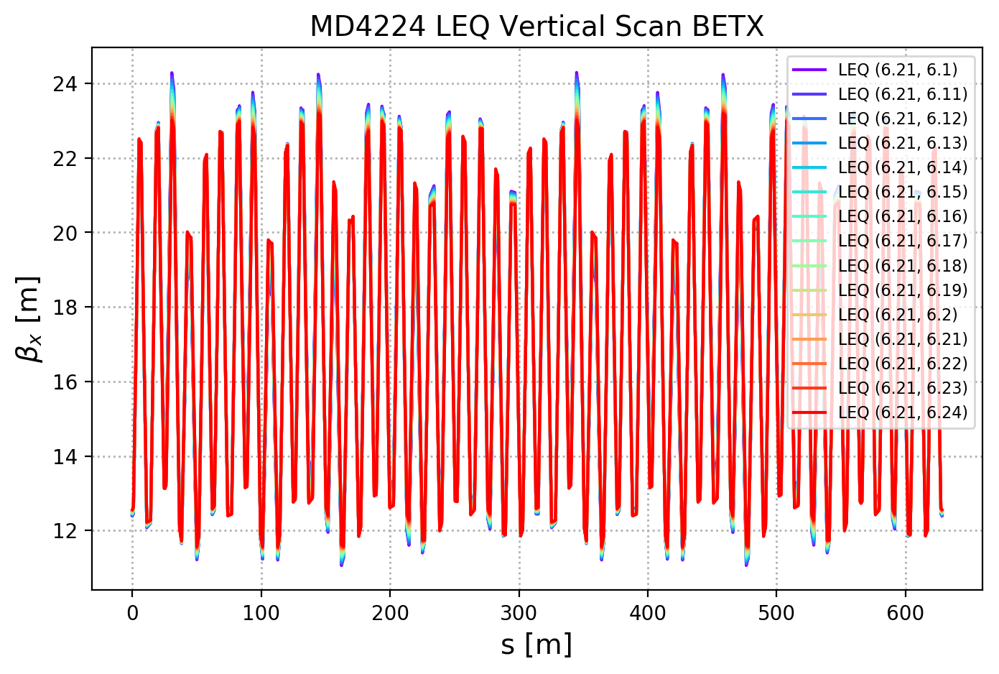

In [88]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

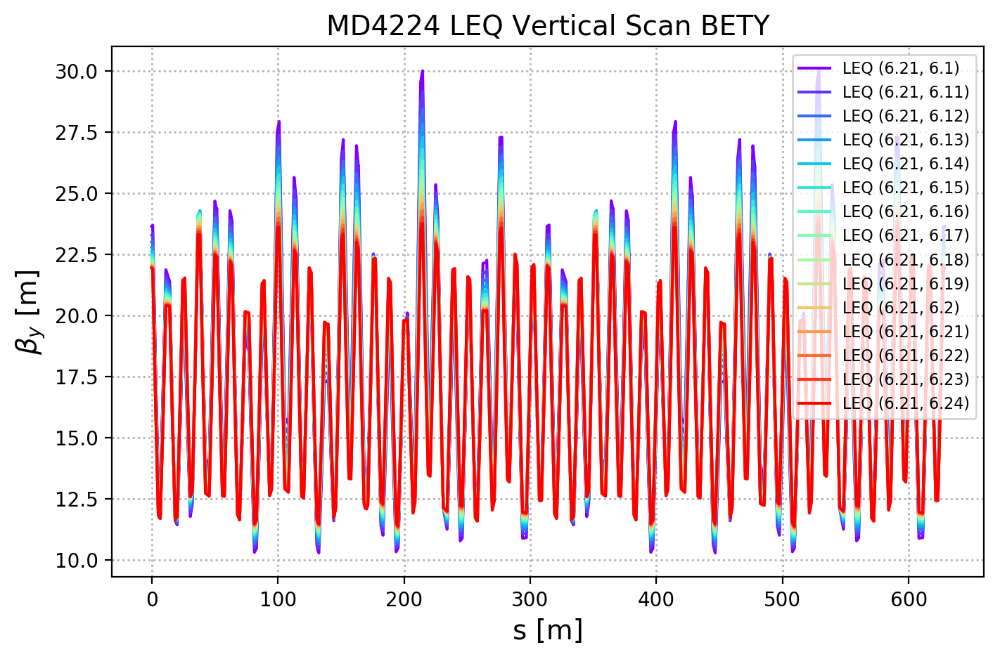

In [89]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

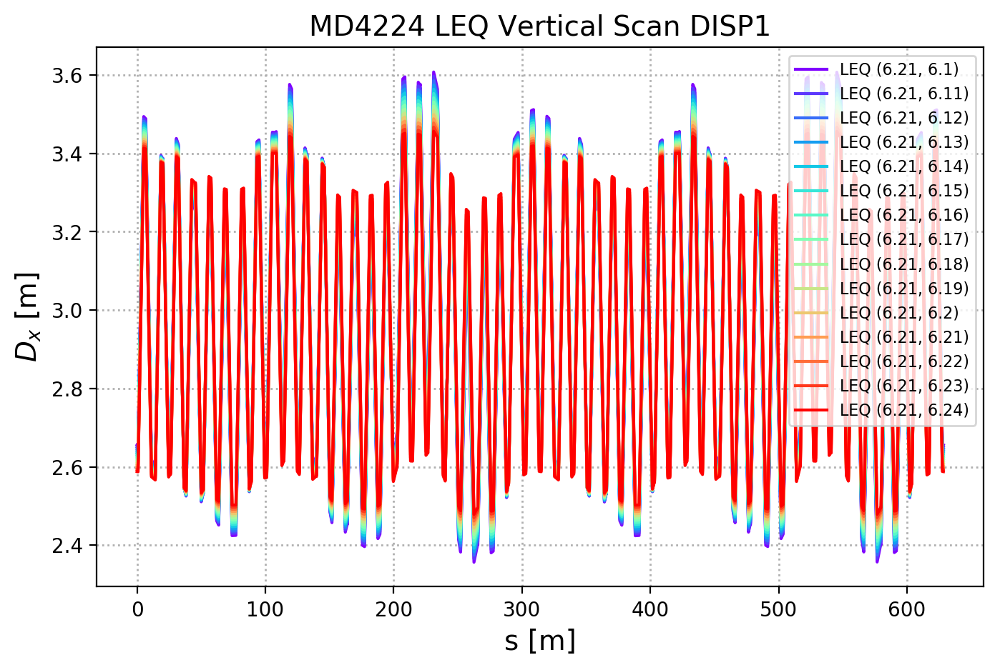

In [90]:
parameter = 'DISP1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

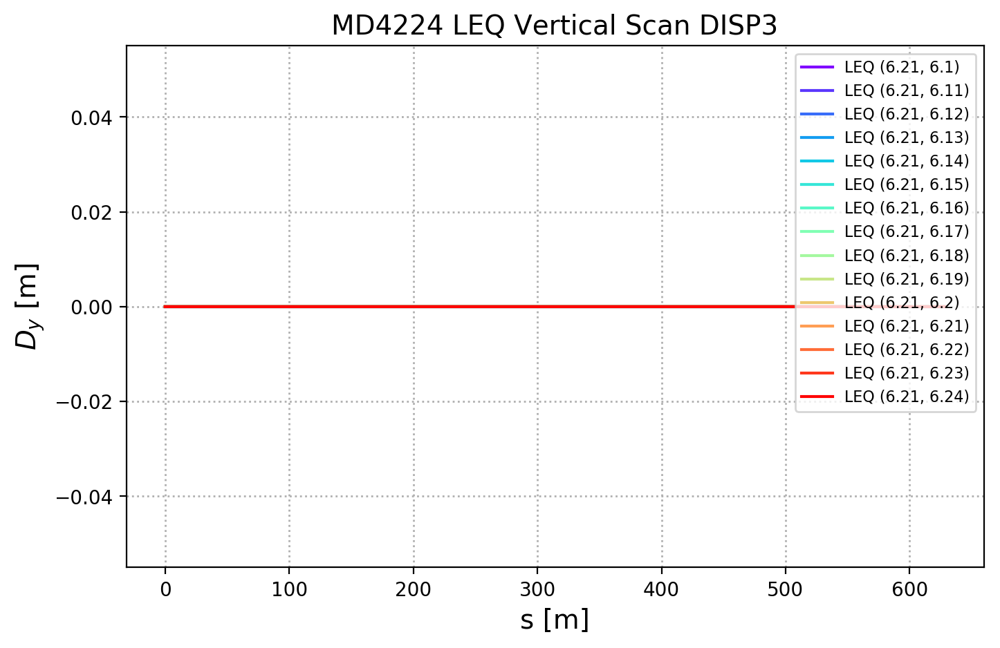

In [91]:
parameter = 'DISP3'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

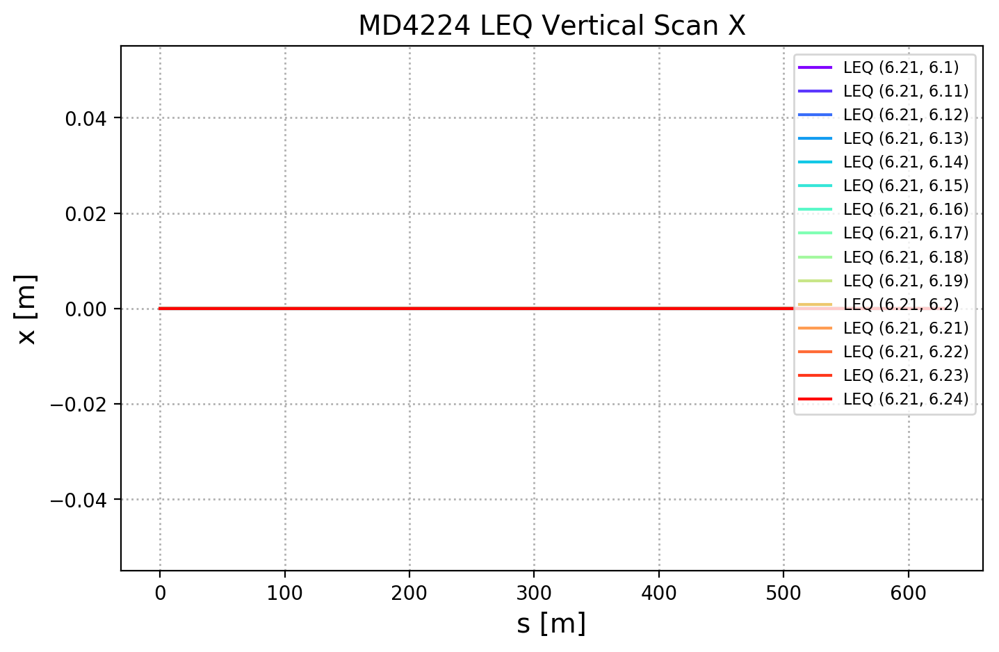

In [94]:
parameter = 'X'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

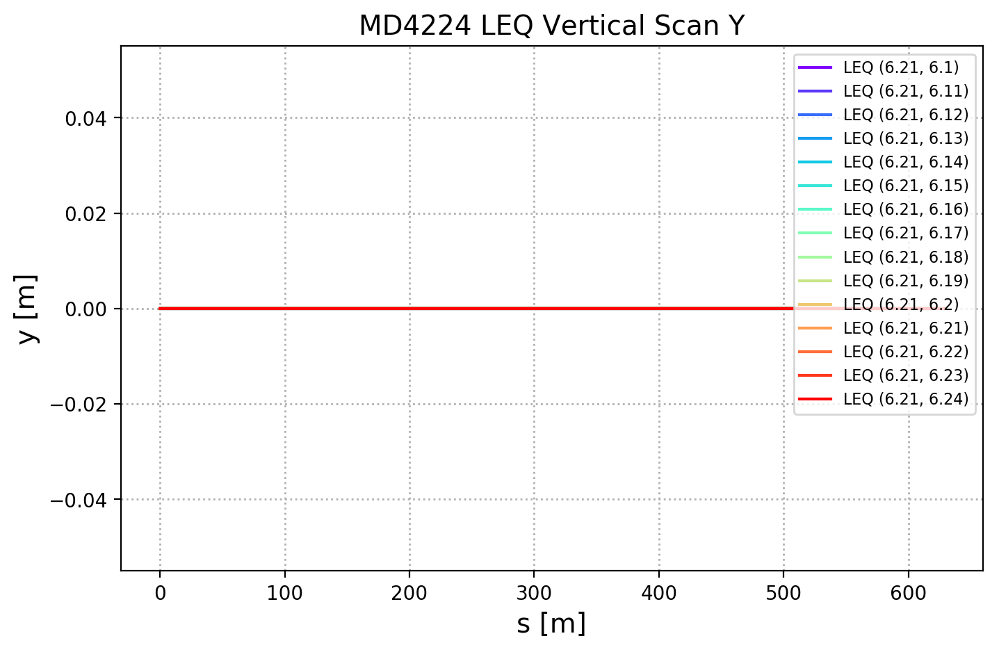

In [95]:
parameter = 'Y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('y [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

### LEQ Horizontal

In [97]:
main_label = 'MD4224'
case_label = 'LEQ Horizontal Scan'
save_folder = 'LEQ_Horizontal/'
make_directory(save_folder)

Creation of the directory LEQ_Horizontal/ failed


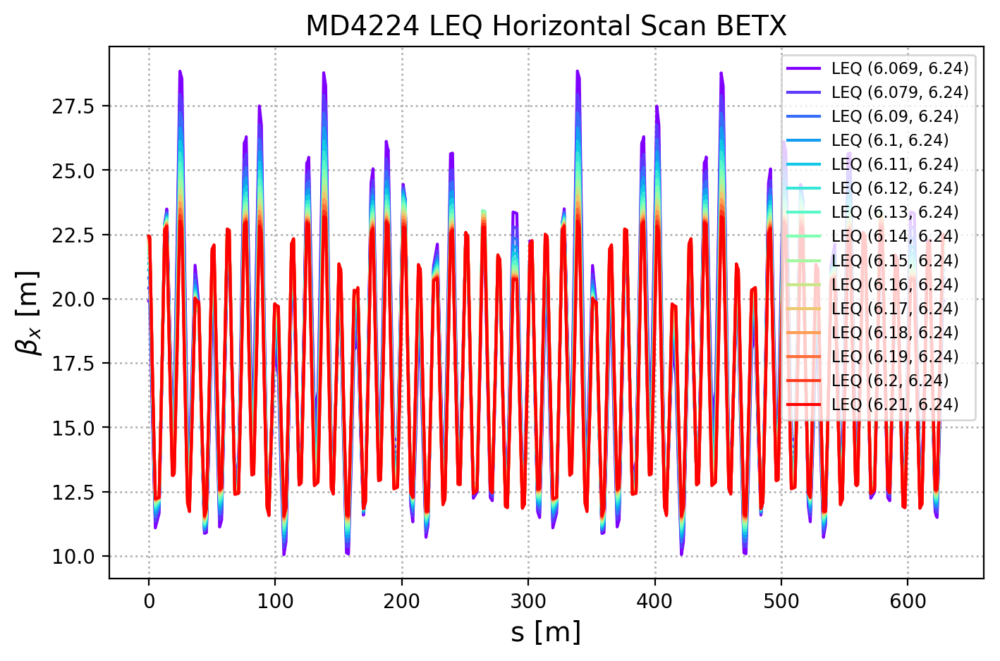

In [98]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

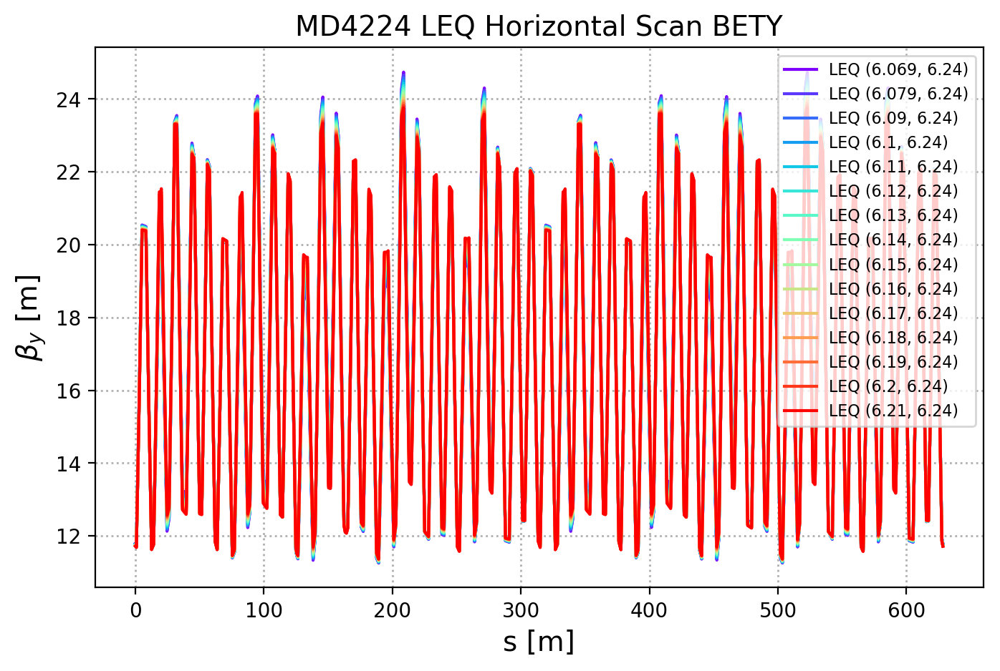

In [99]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

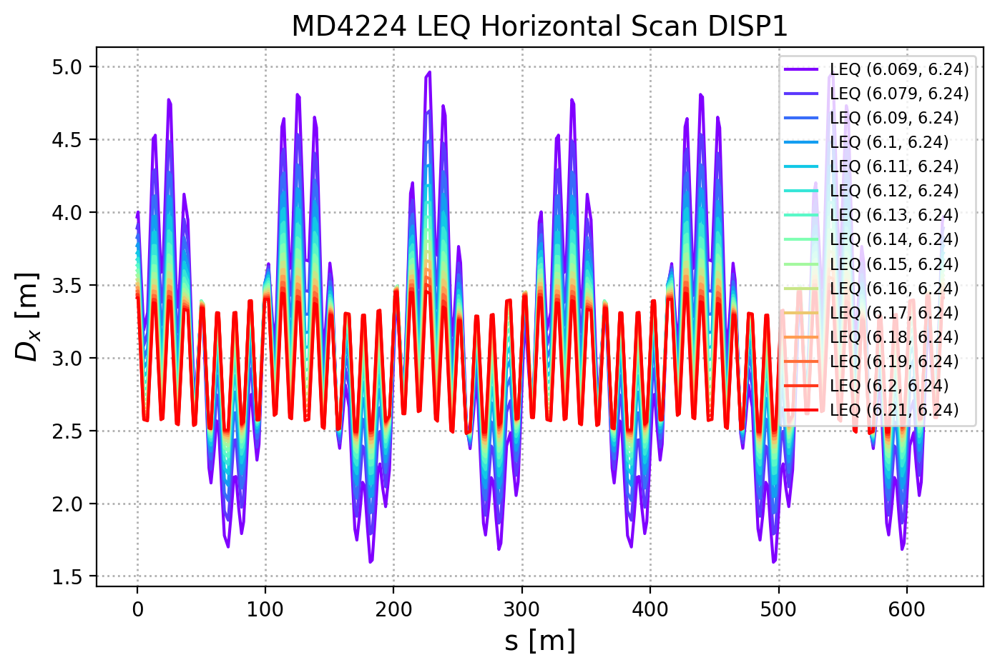

In [100]:
parameter = 'DISP1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

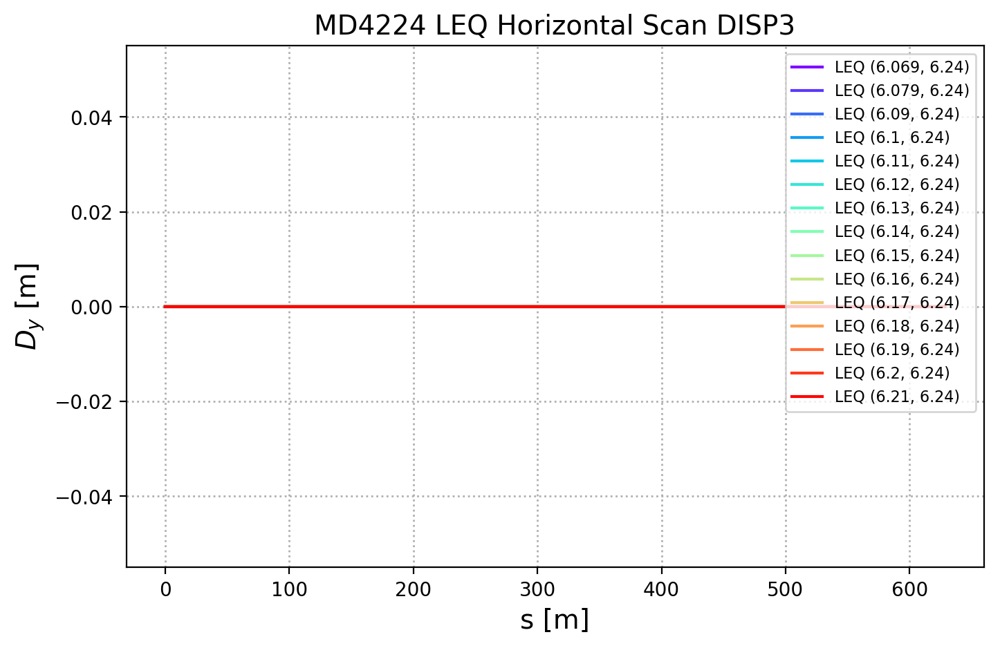

In [101]:
parameter = 'DISP3'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

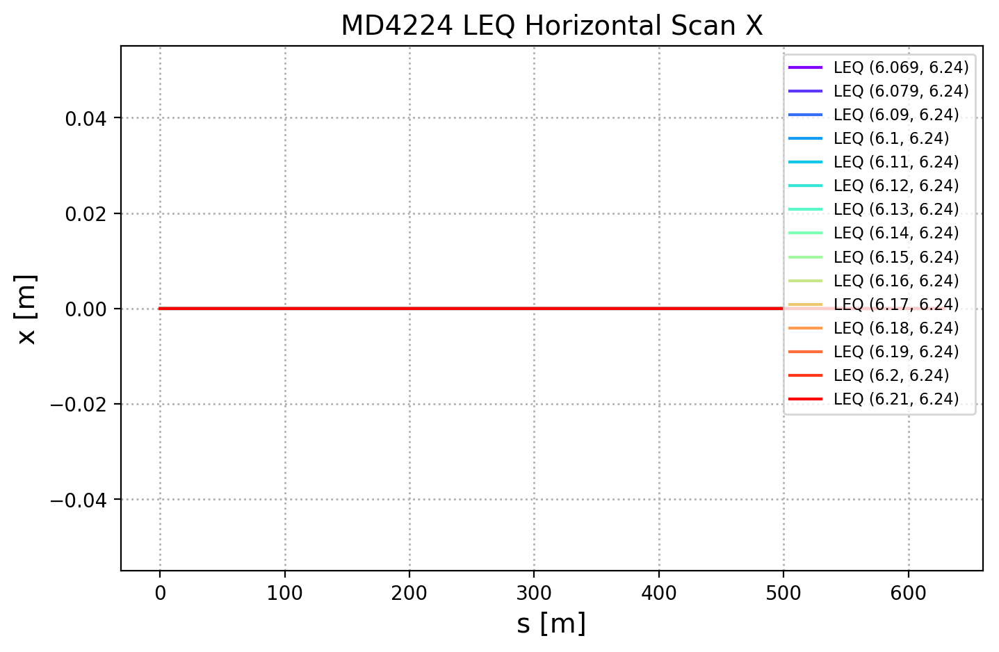

In [102]:
parameter = 'X'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

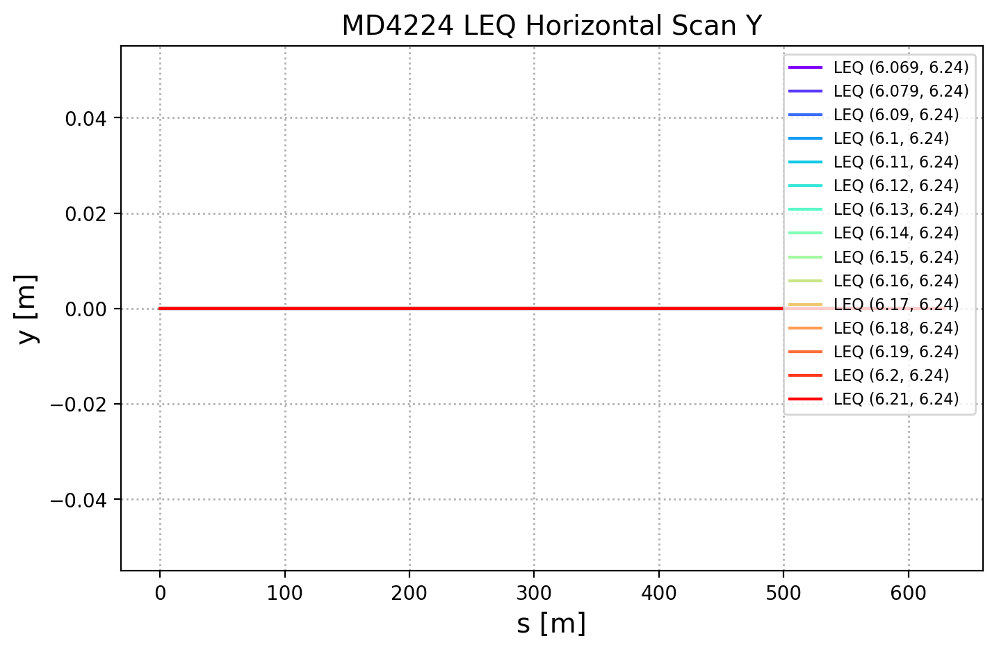

In [103]:
parameter = 'Y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('y [m]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_H_List)))
c_it = int(0)
for d in LEQ_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

### PFW Vertical

In [104]:
main_label = 'MD4224'
case_label = 'PFW Vertical Scan'
save_folder = 'PFW_Vertical/'
make_directory(save_folder)

Successfully created the directory PFW_Vertical/ 


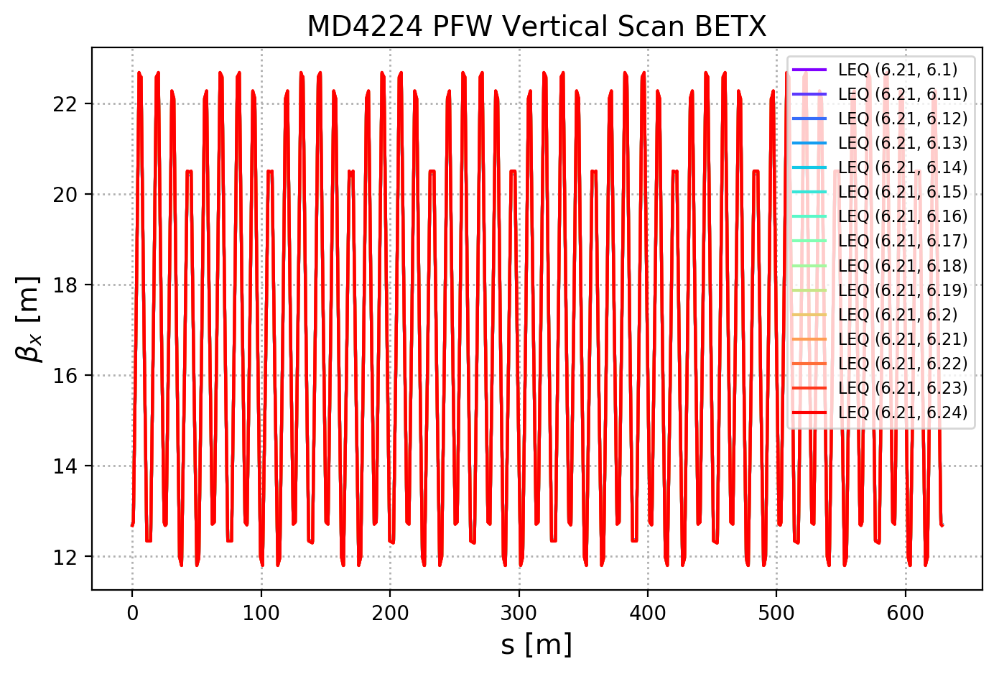

In [105]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

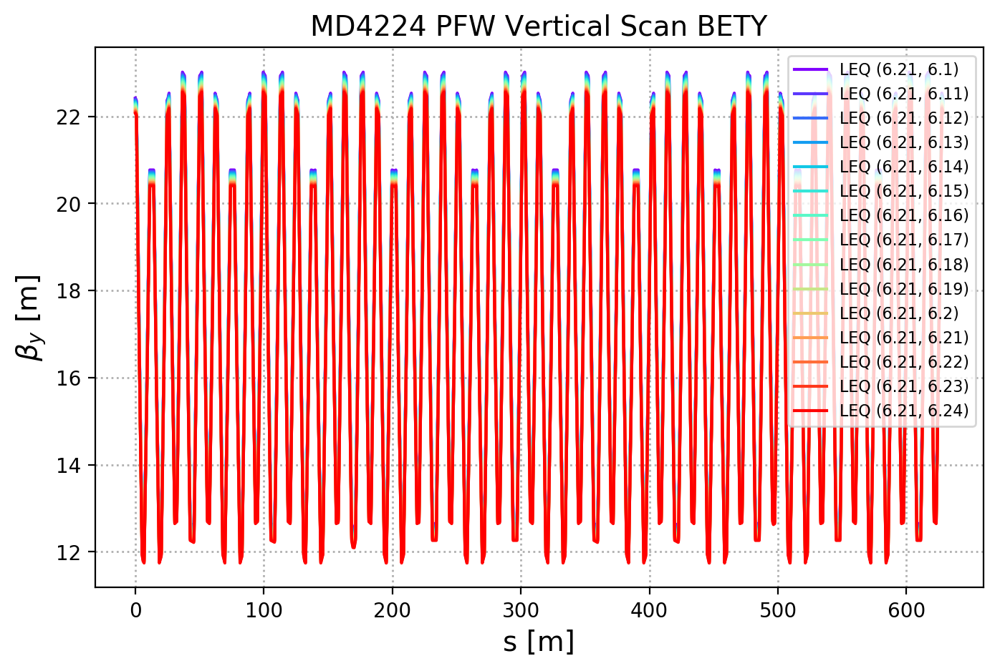

In [106]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

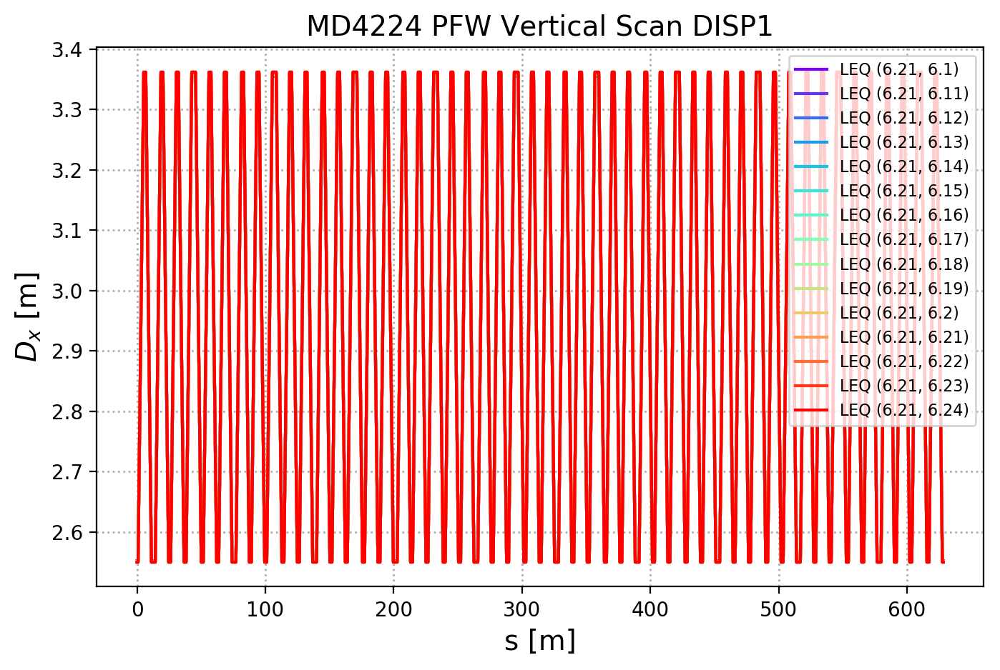

In [107]:
parameter = 'DISP1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

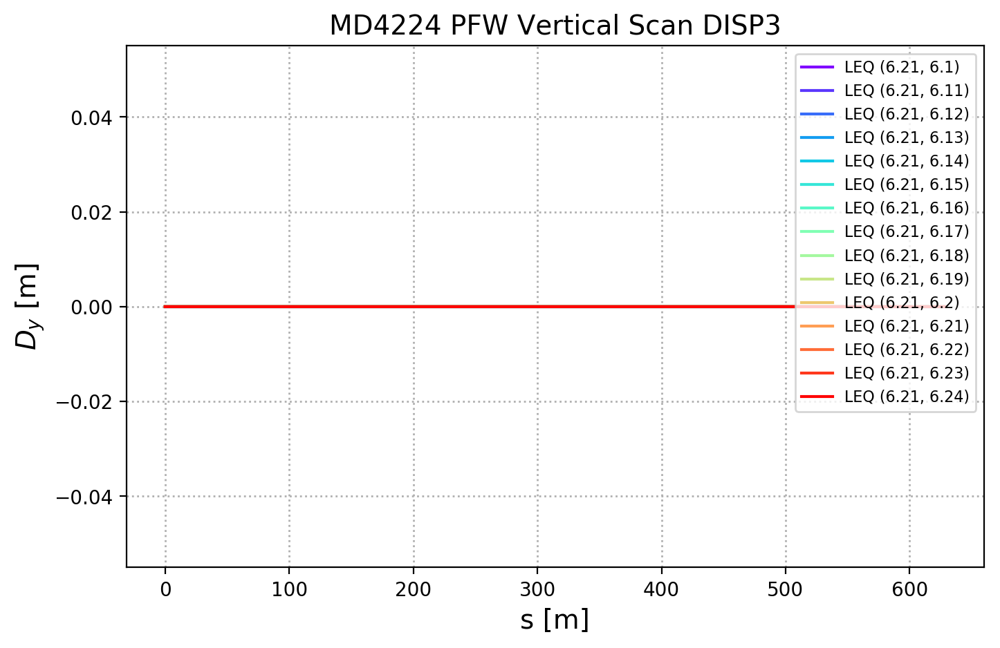

In [108]:
parameter = 'DISP3'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

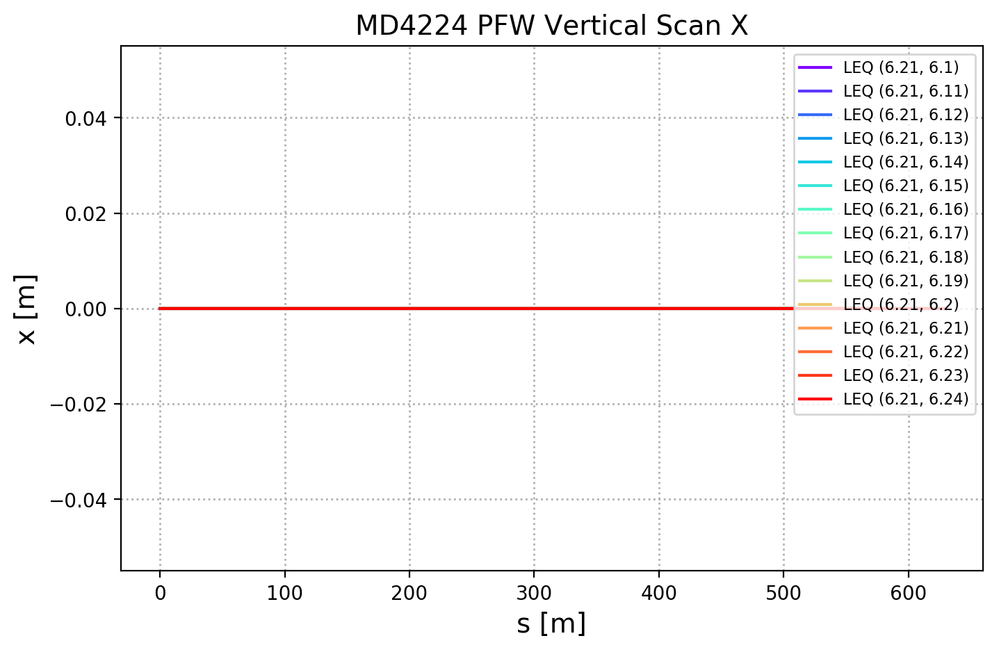

In [109]:
parameter = 'X'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

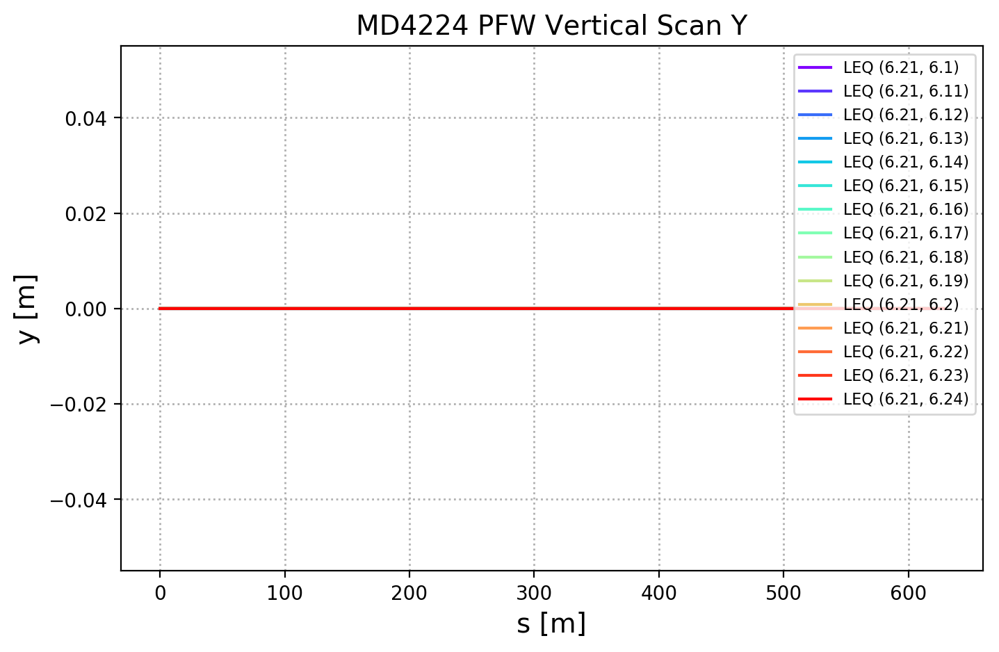

In [110]:
parameter = 'Y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('y [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_V_List)))
c_it = int(0)
for d in PFW_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

### PFW H Scan

In [111]:
main_label = 'MD4224'
case_label = 'PFW Horizontal Scan'
save_folder = 'PFW_Horizontal/'
make_directory(save_folder)

Successfully created the directory PFW_Horizontal/ 


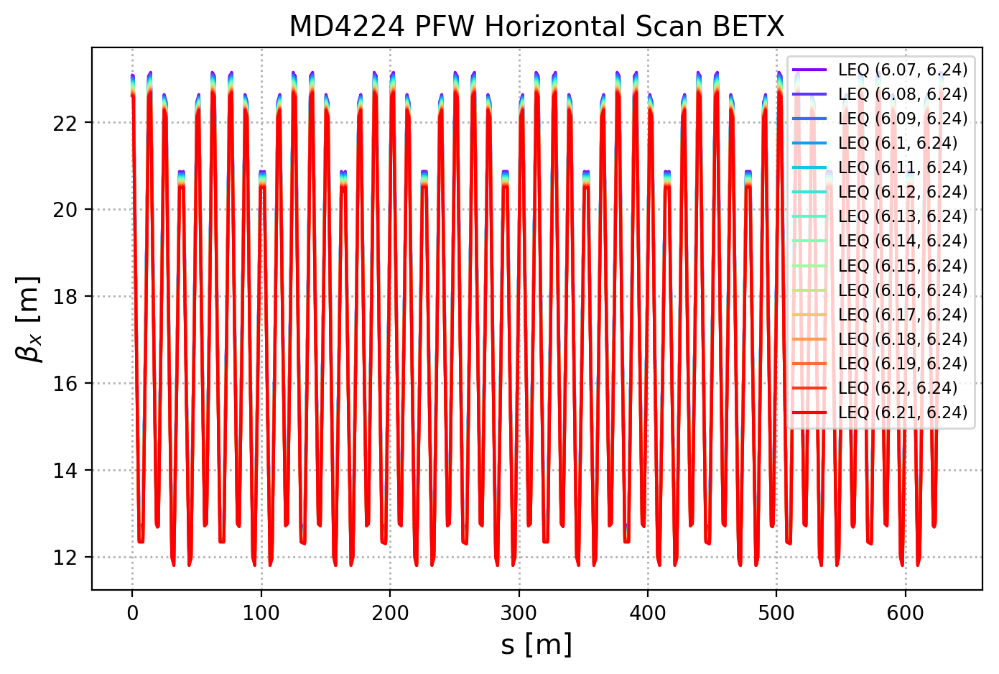

In [112]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

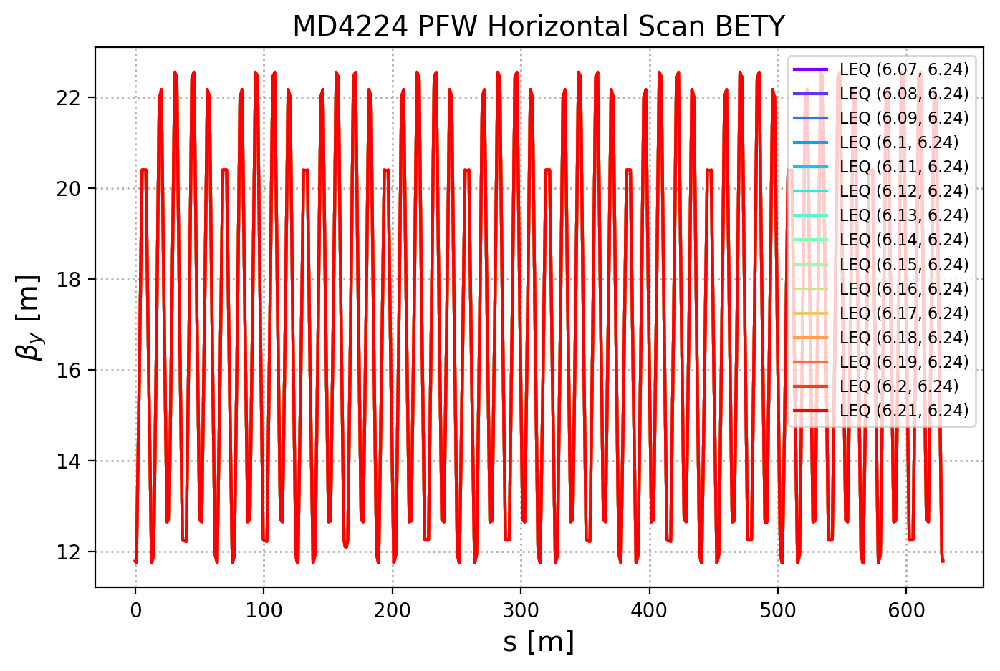

In [113]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

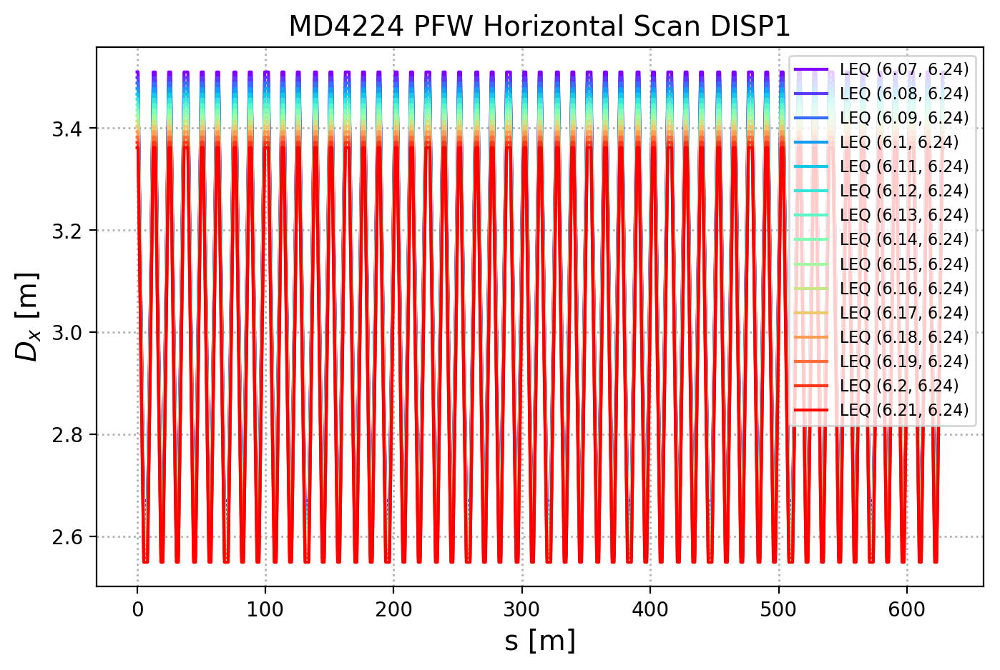

In [114]:
parameter = 'DISP1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

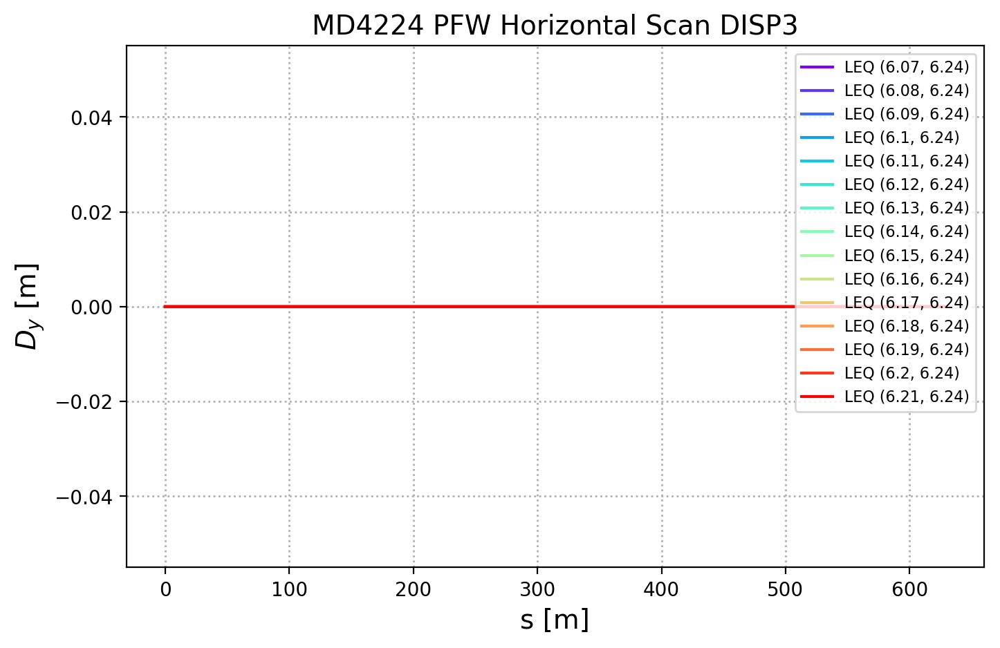

In [115]:
parameter = 'DISP3'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$D_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

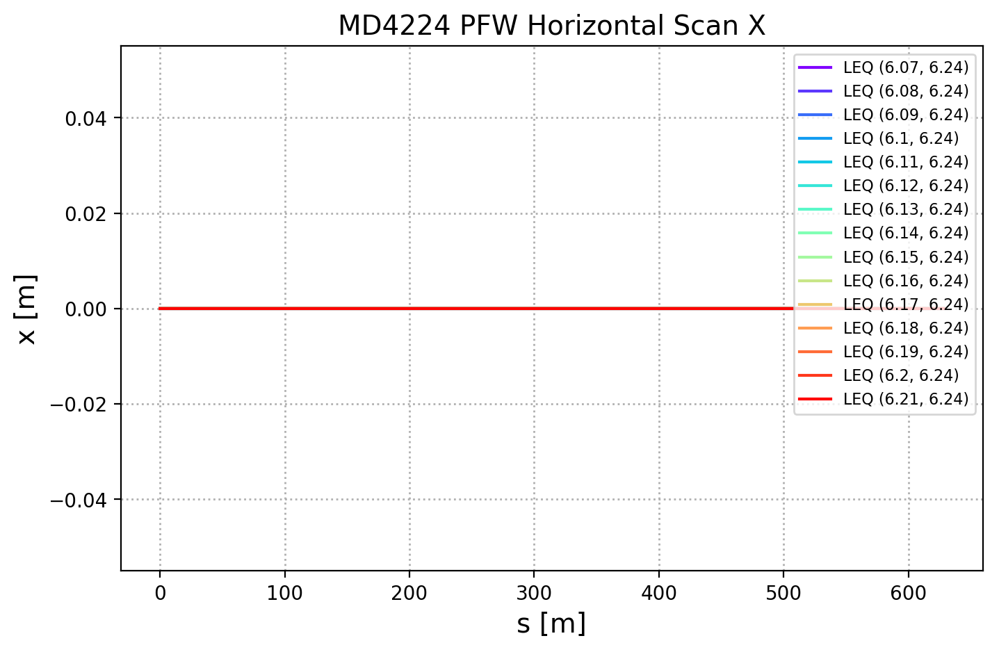

In [116]:
parameter = 'X'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

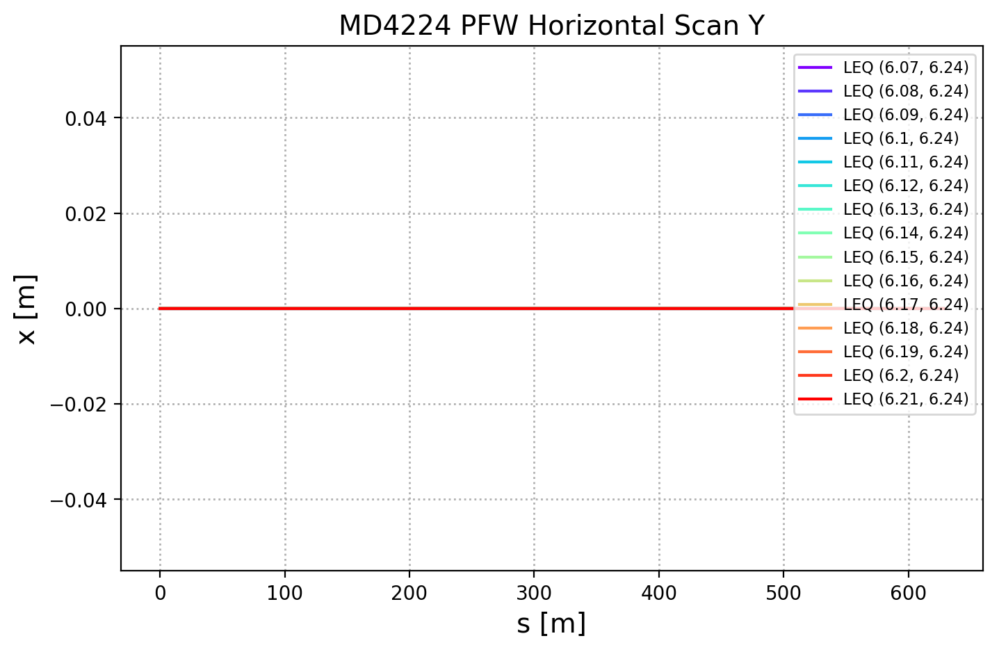

In [117]:
parameter = 'Y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_H_List)))
c_it = int(0)
for d in PFW_H_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

### PFW + quadrupole error

In [128]:
main_label = 'MD4224'
case_label = 'PFW Vertical Scan Quad Error'
save_folder = 'PFW_Vertical_Quad/'
make_directory(save_folder)

Creation of the directory PFW_Vertical_Quad/ failed


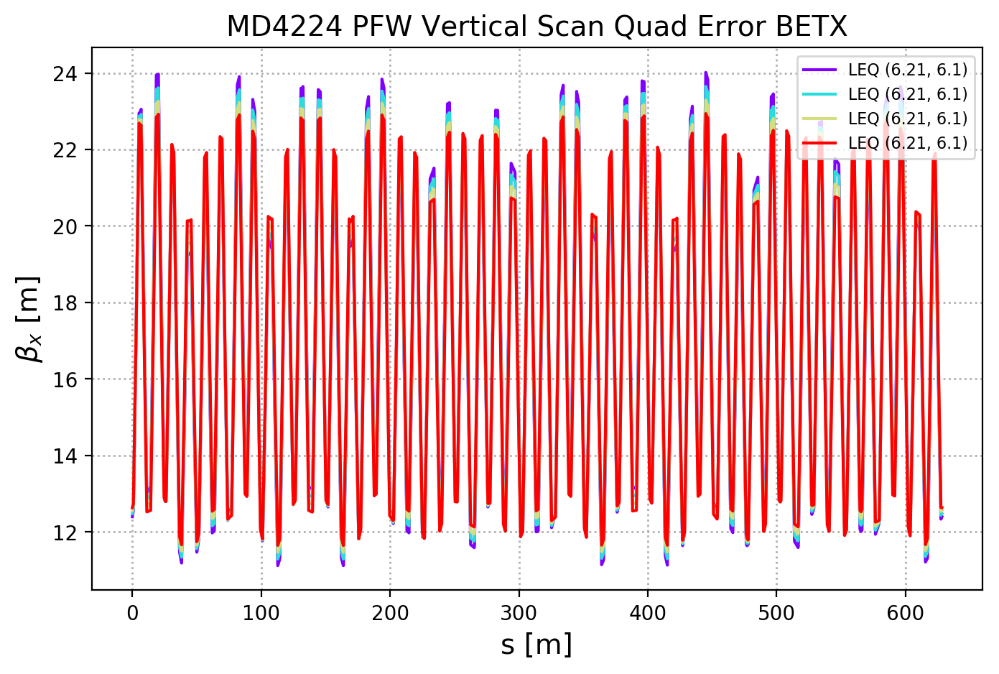

In [132]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_x$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

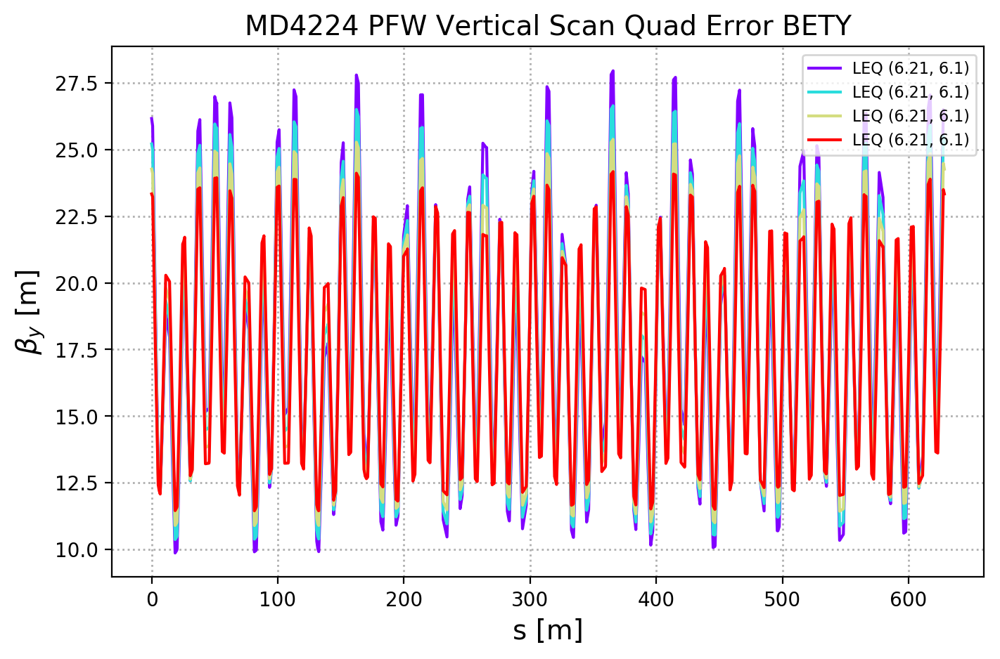

In [133]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_y$ [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

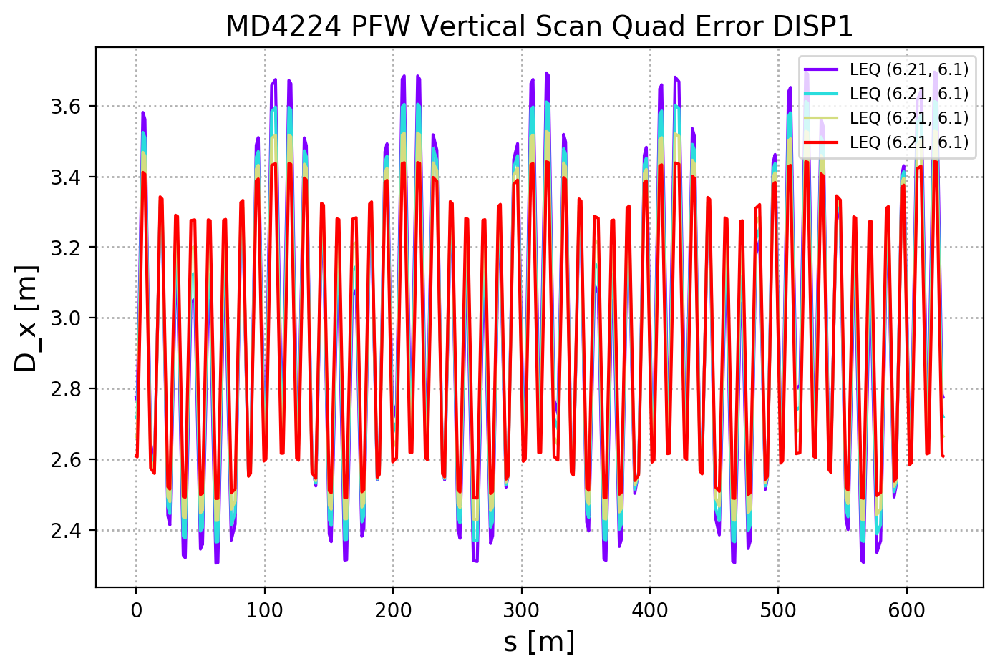

In [134]:
parameter = 'DISP1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('D_x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

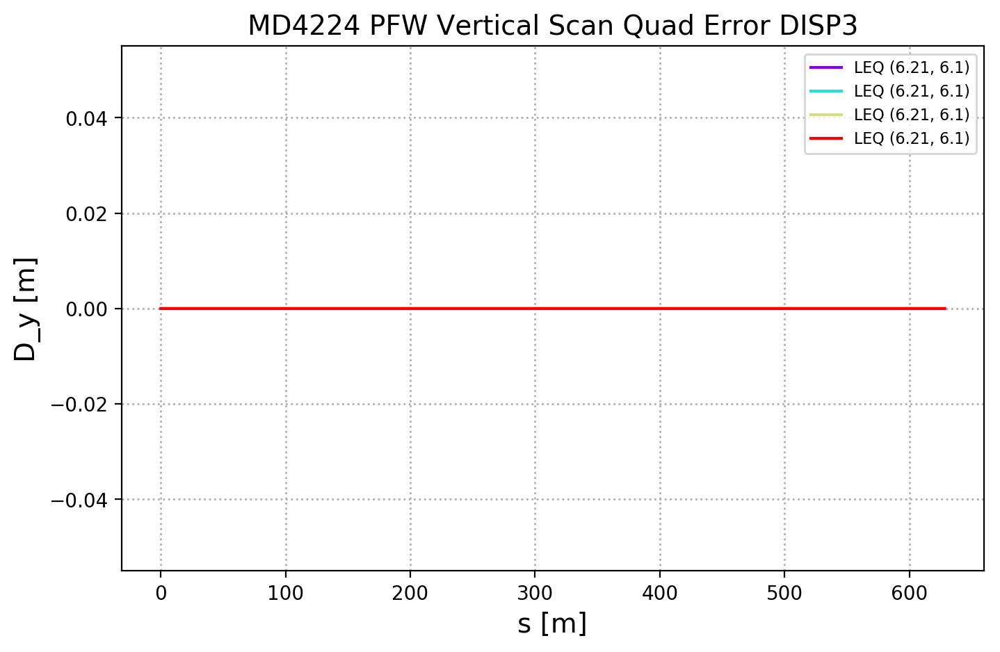

In [135]:
parameter = 'DISP3'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('D_y [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

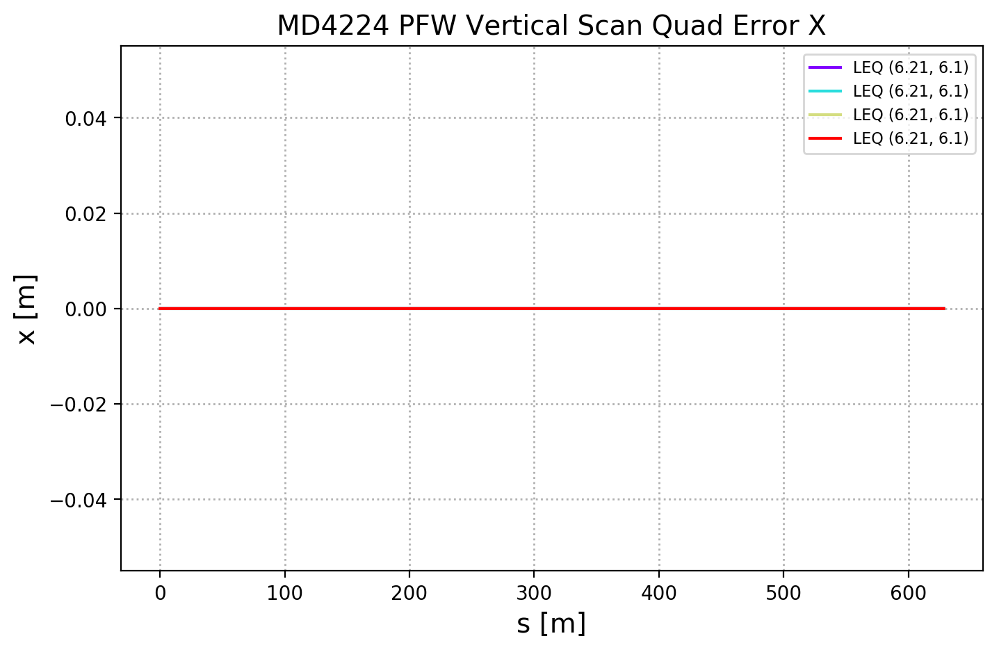

In [136]:
parameter = 'X'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

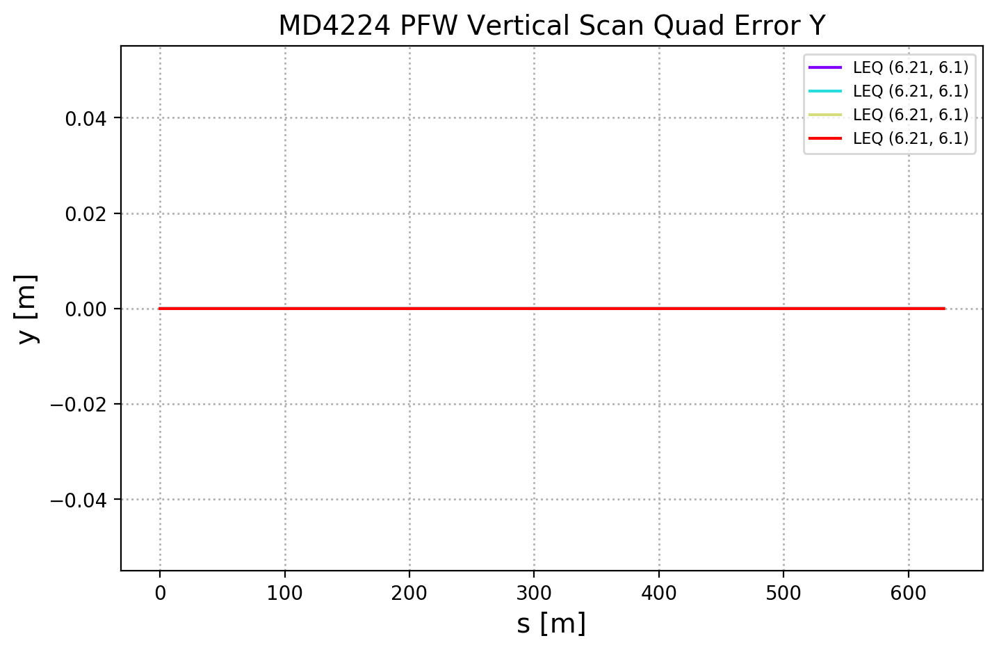

In [137]:
parameter = 'Y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('y [m]');

colors = cm.rainbow(np.linspace(0, 1, len(PFW_Quad_List)))
c_it = int(0)
for d in PFW_Quad_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    ax1.plot(d['S'], d[parameter], label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

# Compare beta beating

- Use PFW scan at operational working point as the reference

In [138]:
main_label = 'MD4224'
case_label = 'PFW Vertical Scan'
save_folder = 'Vertical_Beating/'
make_directory(save_folder)

Successfully created the directory Vertical_Beating/ 


ValueError: operands could not be broadcast together with shapes (1115,) (1129,) 

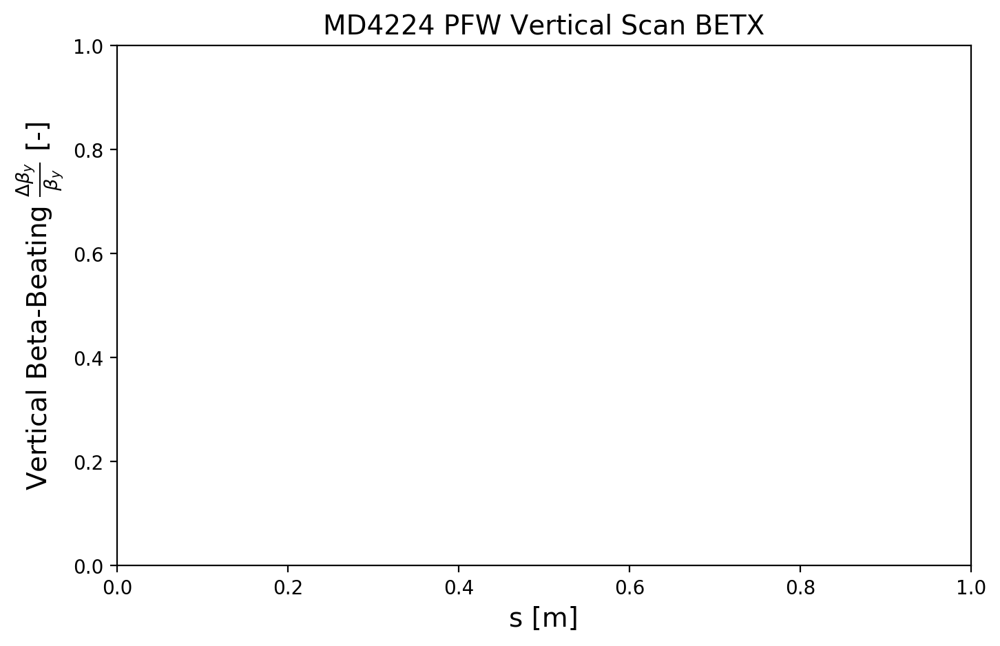

In [140]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label+ ' ' + case_label + ' '  + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'Vertical Beta-Beating $\frac{\Delta \beta_y}{\beta_{y}}$ [-]');

colors = cm.rainbow(np.linspace(0, 1, len(LEQ_V_List)))
c_it = int(0)
for d in LEQ_V_List:
    lab_ =  'LEQ (' + str(6+round_sig(d['HEADER_Q1'][0],2)) + ', ' + str(6+round_sig(d['HEADER_Q2'][0],2)) + ')'
    x_dat = np.array(d['S'])
    y_dat = np.array(d[parameter]) / np.array(PFW_V_24[parameter])
    ax1.plot(x_dat, y_dat, label=lab_, color=colors[c_it]);
    c_it = c_it + 1;

ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label +'_Vertical_Beta_Beating.png'
plt.savefig(savename, dpi = 200);



In [ ]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel(r'Vertical Phase Advance $\phi_y$ [-]');
ax1.set_ylabel(r'Vertical Beta-Beating $\frac{\Delta \beta_y}{\beta_{y}}$ [-]');

x1 = np.array(d_LEQ['MU2'])
y1 = (np.array(d_LEQ[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x1, y1, label='LEQ', color='k');

x2 = np.array(d_PFW['MU2'])
y2 = (np.array(d_PFW[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x2, y2, label='PFW', color='b');

x3 = np.array(d_PFW_Single['MU2'])
y3 = (np.array(d_PFW_Single[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x3, y3, label='PFW + Single Quad Error', color='c', ls=':');

x4 = np.array(d_PFW_Distributed['MU2'])
y4 = (np.array(d_PFW_Distributed[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x4, y4, label='PFW + Distributed Quad Error', color='m', ls=':');

x5 = np.array(d_PFW_nonlin['MU1'])
y5 = (np.array(d_PFW_nonlin[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x5, y5, label='PFW Non-Linear', color='r', ls=':');
         
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '__Vertical_Beta_Beating.png'
plt.savefig(savename, dpi = 200);

### First check that the phase advance in each plane is the same for all lattices

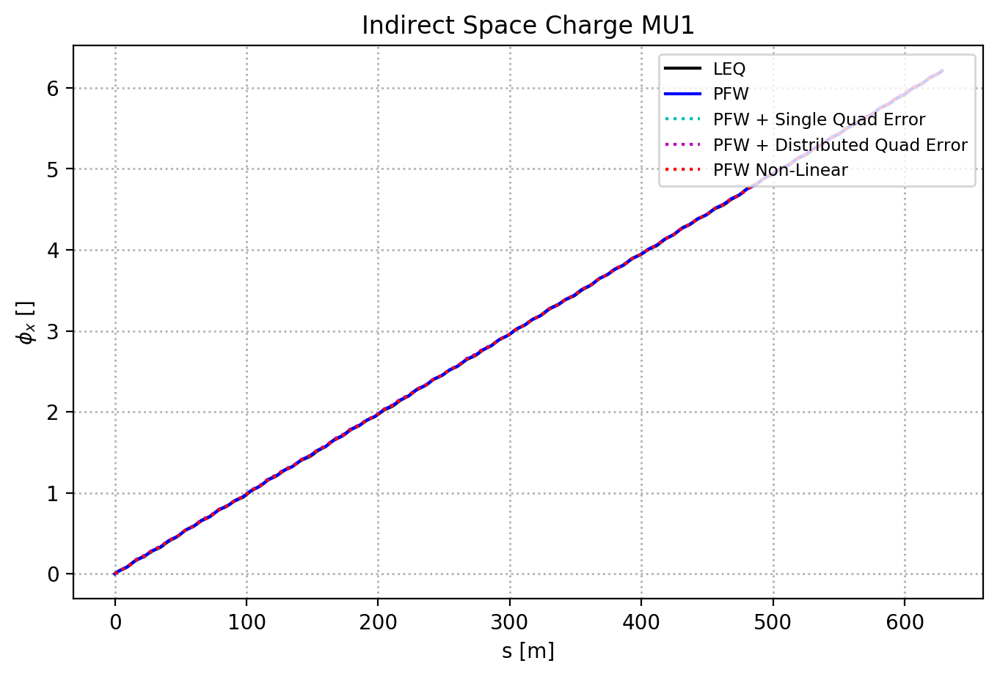

In [17]:
parameter = 'MU1'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\phi_x$ []');

ax1.plot(d_LEQ['S'], d_LEQ[parameter], label='LEQ', color='k');
ax1.plot(d_PFW['S'], d_PFW[parameter], label='PFW', color='b');
ax1.plot(d_PFW_Single['S'], d_PFW_Single[parameter], label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['S'], d_PFW_Distributed[parameter], label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['S'], d_PFW_nonlin[parameter], label='PFW Non-Linear', color='r', ls=':');
      
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

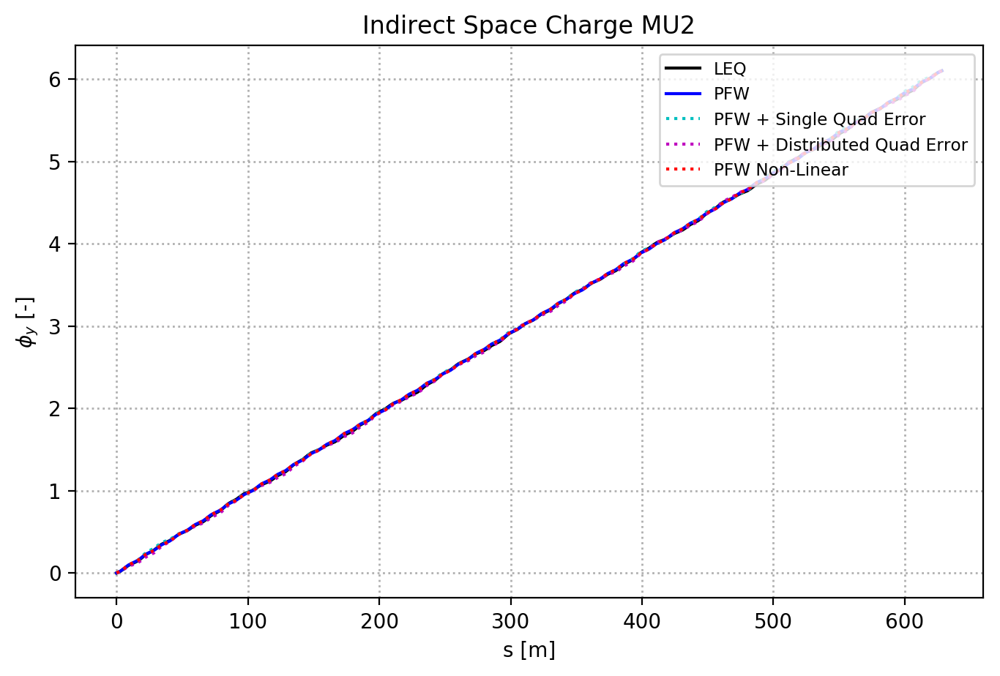

In [18]:
parameter = 'MU2'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\phi_y$ [-]');

ax1.plot(d_LEQ['S'], d_LEQ[parameter], label='LEQ', color='k');
ax1.plot(d_PFW['S'], d_PFW[parameter], label='PFW', color='b');
ax1.plot(d_PFW_Single['S'], d_PFW_Single[parameter], label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['S'], d_PFW_Distributed[parameter], label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['S'], d_PFW_nonlin[parameter], label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

### Horizontal beta-beating for LEQ and PFQ cases with quadrupolar errors are of similar magnitude. 

### There is no beta-beating for the non-linear PFW case

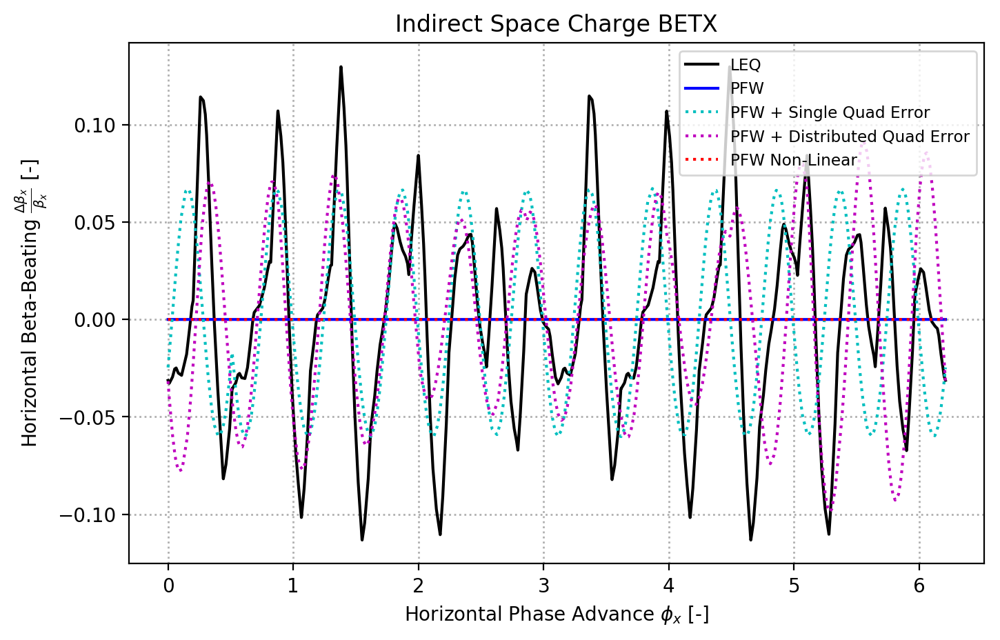

In [19]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel(r'Horizontal Phase Advance $\phi_x$ [-]');
ax1.set_ylabel(r'Horizontal Beta-Beating $\frac{\Delta \beta_x}{\beta_{x}}$ [-]');

x1 = np.array(d_LEQ['MU1'])
y1 = (np.array(d_LEQ[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x1, y1, label='LEQ', color='k');

x2 = np.array(d_PFW['MU1'])
y2 = (np.array(d_PFW[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x2, y2, label='PFW', color='b');

x3 = np.array(d_PFW_Single['MU1'])
y3 = (np.array(d_PFW_Single[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x3, y3, label='PFW + Single Quad Error', color='c', ls=':');

x4 = np.array(d_PFW_Distributed['MU1'])
y4 = (np.array(d_PFW_Distributed[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x4, y4, label='PFW + Distributed Quad Error', color='m', ls=':');

x5 = np.array(d_PFW_nonlin['MU1'])
y5 = (np.array(d_PFW_nonlin[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x5, y5, label='PFW Non-Linear', color='r', ls=':');
           
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_Horizontal_Beta_Beating.png'
plt.savefig(savename, dpi = 200);

### Vertical beta-beating is constructed to be of similar amplitude to LEQs (rounded to ~ 20%)


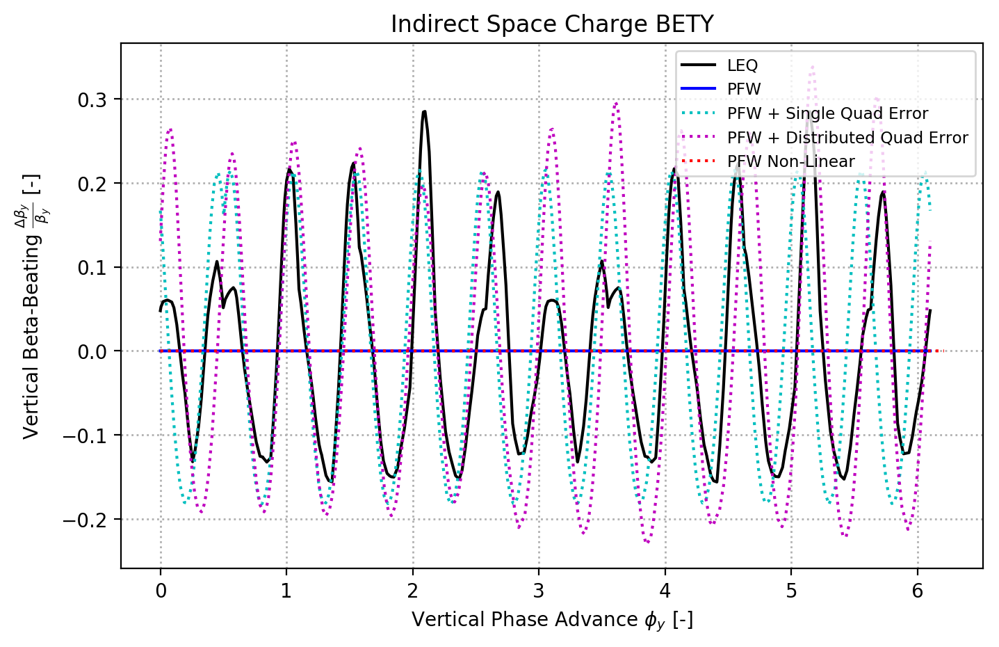

In [20]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel(r'Vertical Phase Advance $\phi_y$ [-]');
ax1.set_ylabel(r'Vertical Beta-Beating $\frac{\Delta \beta_y}{\beta_{y}}$ [-]');

x1 = np.array(d_LEQ['MU2'])
y1 = (np.array(d_LEQ[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x1, y1, label='LEQ', color='k');

x2 = np.array(d_PFW['MU2'])
y2 = (np.array(d_PFW[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x2, y2, label='PFW', color='b');

x3 = np.array(d_PFW_Single['MU2'])
y3 = (np.array(d_PFW_Single[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x3, y3, label='PFW + Single Quad Error', color='c', ls=':');

x4 = np.array(d_PFW_Distributed['MU2'])
y4 = (np.array(d_PFW_Distributed[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x4, y4, label='PFW + Distributed Quad Error', color='m', ls=':');

x5 = np.array(d_PFW_nonlin['MU1'])
y5 = (np.array(d_PFW_nonlin[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x5, y5, label='PFW Non-Linear', color='r', ls=':');
         
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '__Vertical_Beta_Beating.png'
plt.savefig(savename, dpi = 200);

### we can see the position of the single quadruoplar kick between 0 and 1 in vertical phase advance

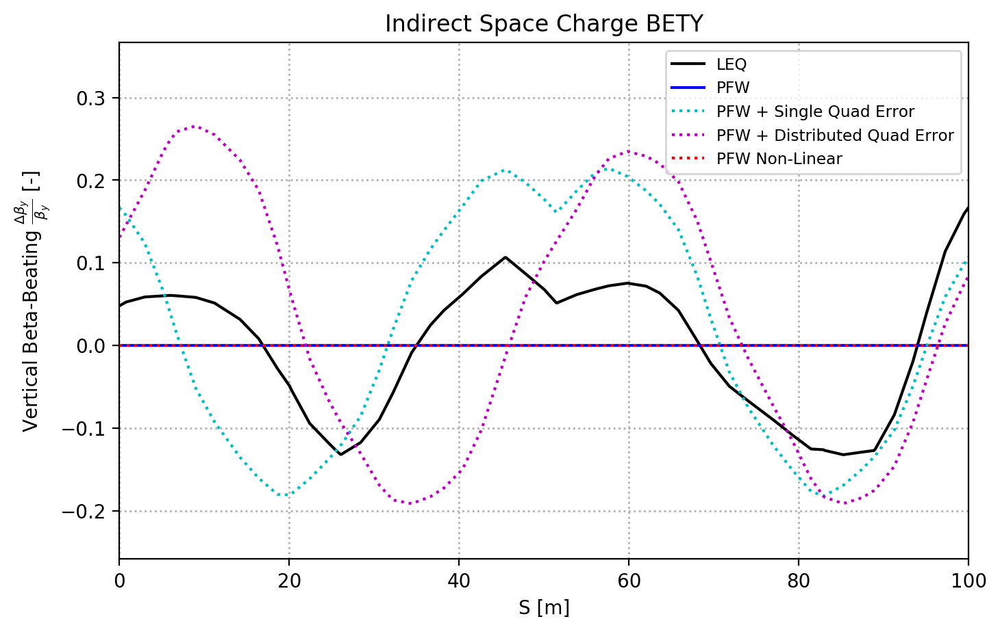

In [21]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('S [m]');
ax1.set_ylabel(r'Vertical Beta-Beating $\frac{\Delta \beta_y}{\beta_{y}}$ [-]');

x1 = np.array(d_LEQ['S'])
y1 = (np.array(d_LEQ[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x1, y1, label='LEQ', color='k');

x2 = np.array(d_PFW['S'])
y2 = (np.array(d_PFW[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x2, y2, label='PFW', color='b');

x3 = np.array(d_PFW_Single['S'])
y3 = (np.array(d_PFW_Single[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x3, y3, label='PFW + Single Quad Error', color='c', ls=':');

x4 = np.array(d_PFW_Distributed['S'])
y4 = (np.array(d_PFW_Distributed[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x4, y4, label='PFW + Distributed Quad Error', color='m', ls=':');

x5 = np.array(d_PFW_nonlin['S'])
y5 = (np.array(d_PFW_nonlin[parameter])-np.array(d_PFW[parameter]))/np.array(d_PFW[parameter])
ax1.plot(x5, y5, label='PFW Non-Linear', color='r', ls=':');
         
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(0,100)

savename = save_folder + '/'+ main_label + '__Vertical_Beta_Beating_QDN.png'
plt.savefig(savename, dpi = 200);

# Step 2: Plot to compare optics

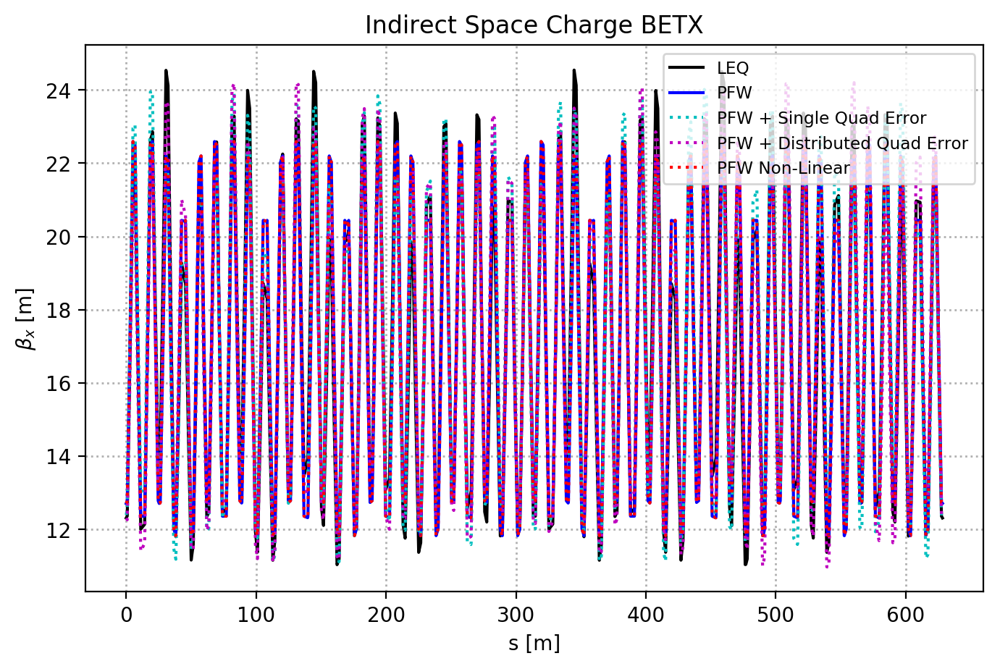

In [22]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_x$ [m]');

ax1.plot(d_LEQ['S'], d_LEQ[parameter], label='LEQ', color='k');
ax1.plot(d_PFW['S'], d_PFW[parameter], label='PFW', color='b');
ax1.plot(d_PFW_Single['S'], d_PFW_Single[parameter], label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['S'], d_PFW_Distributed[parameter], label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['S'], d_PFW_nonlin[parameter], label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

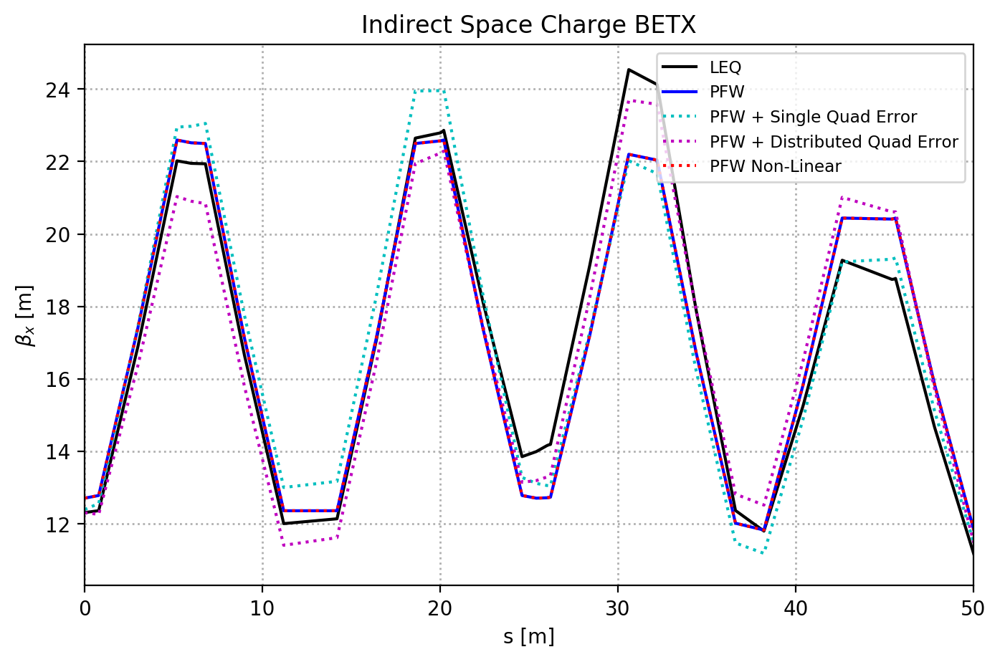

In [23]:
parameter = 'BETX'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_x$ [m]');

ax1.plot(d_LEQ['S'], d_LEQ[parameter], label='LEQ', color='k');
ax1.plot(d_PFW['S'], d_PFW[parameter], label='PFW', color='b');
ax1.plot(d_PFW_Single['S'], d_PFW_Single[parameter], label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['S'], d_PFW_Distributed[parameter], label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['S'], d_PFW_nonlin[parameter], label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(0,50)

savename = save_folder + '/'+ main_label + '_' + parameter + 'zoom.png'
plt.savefig(savename, dpi = 200);

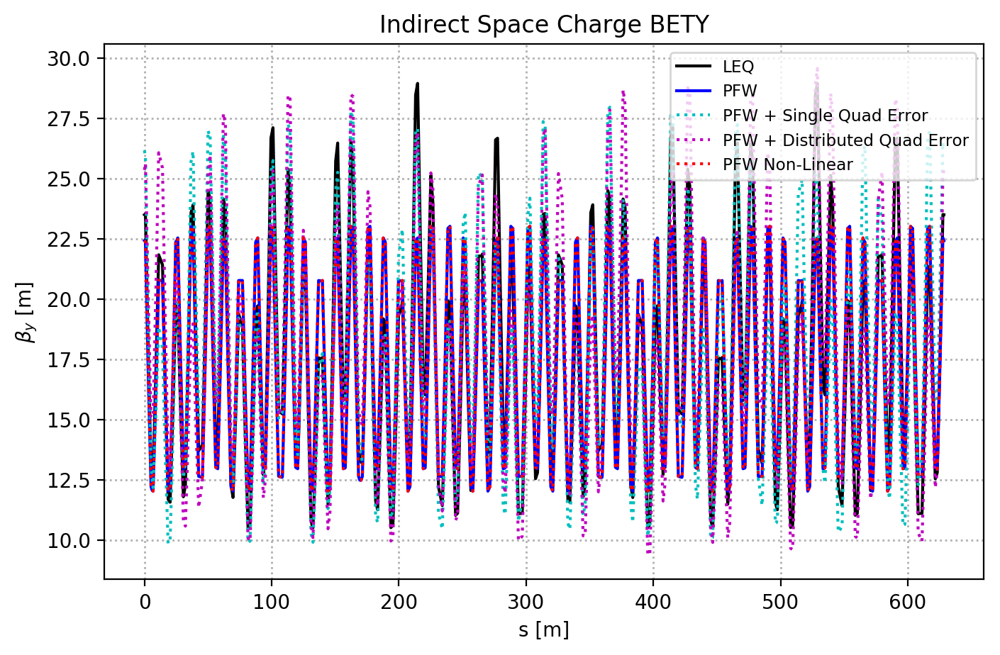

In [24]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_y$ [m]');

ax1.plot(d_LEQ['S'], d_LEQ[parameter], label='LEQ', color='k');
ax1.plot(d_PFW['S'], d_PFW[parameter], label='PFW', color='b');
ax1.plot(d_PFW_Single['S'], d_PFW_Single[parameter], label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['S'], d_PFW_Distributed[parameter], label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['S'], d_PFW_nonlin[parameter], label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

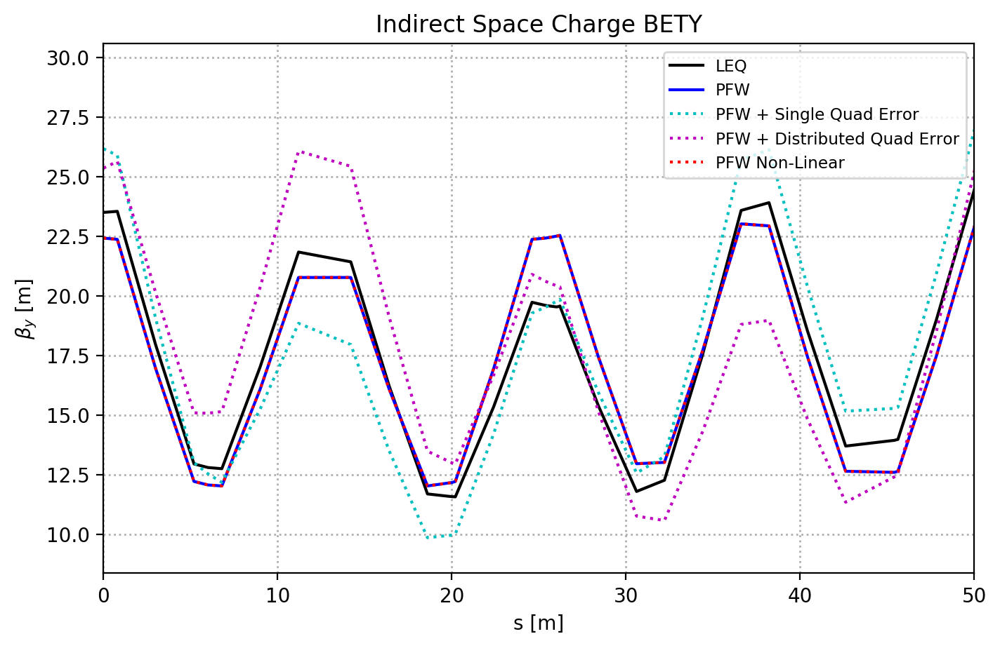

In [25]:
parameter = 'BETY'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\beta_y$ [m]');

ax1.plot(d_LEQ['S'], d_LEQ[parameter], label='LEQ', color='k');
ax1.plot(d_PFW['S'], d_PFW[parameter], label='PFW', color='b');
ax1.plot(d_PFW_Single['S'], d_PFW_Single[parameter], label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['S'], d_PFW_Distributed[parameter], label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['S'], d_PFW_nonlin[parameter], label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(0,50)

savename = save_folder + '/'+ main_label + '_' + parameter + 'zoom.png'
plt.savefig(savename, dpi = 200);

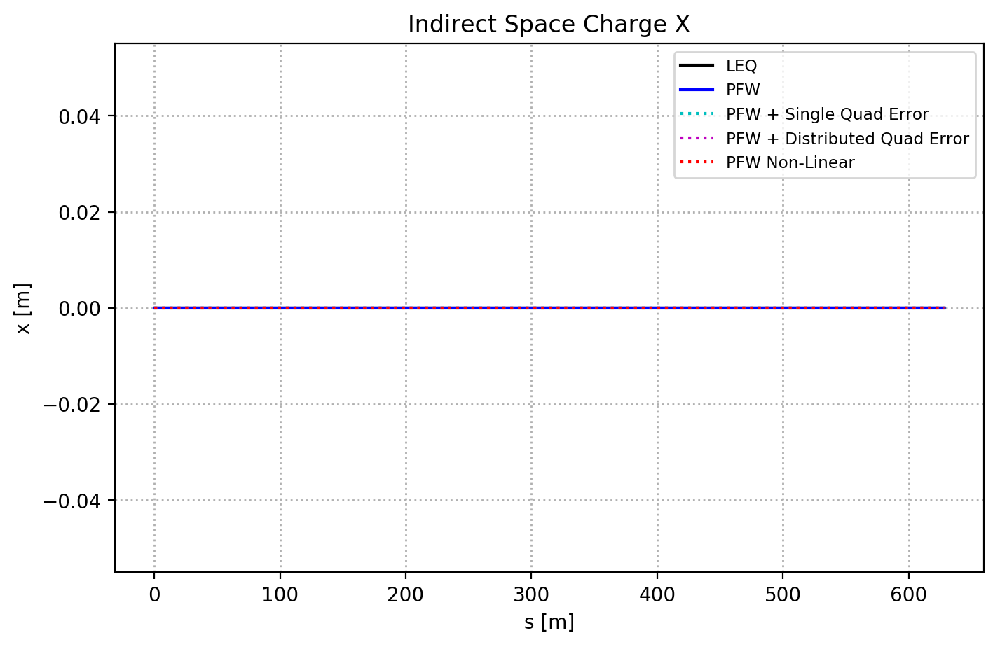

In [26]:
parameter = 'X'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('x [m]');

ax1.plot(d_LEQ['S'], d_LEQ[parameter], label='LEQ', color='k');
ax1.plot(d_PFW['S'], d_PFW[parameter], label='PFW', color='b');
ax1.plot(d_PFW_Single['S'], d_PFW_Single[parameter], label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['S'], d_PFW_Distributed[parameter], label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['S'], d_PFW_nonlin[parameter], label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

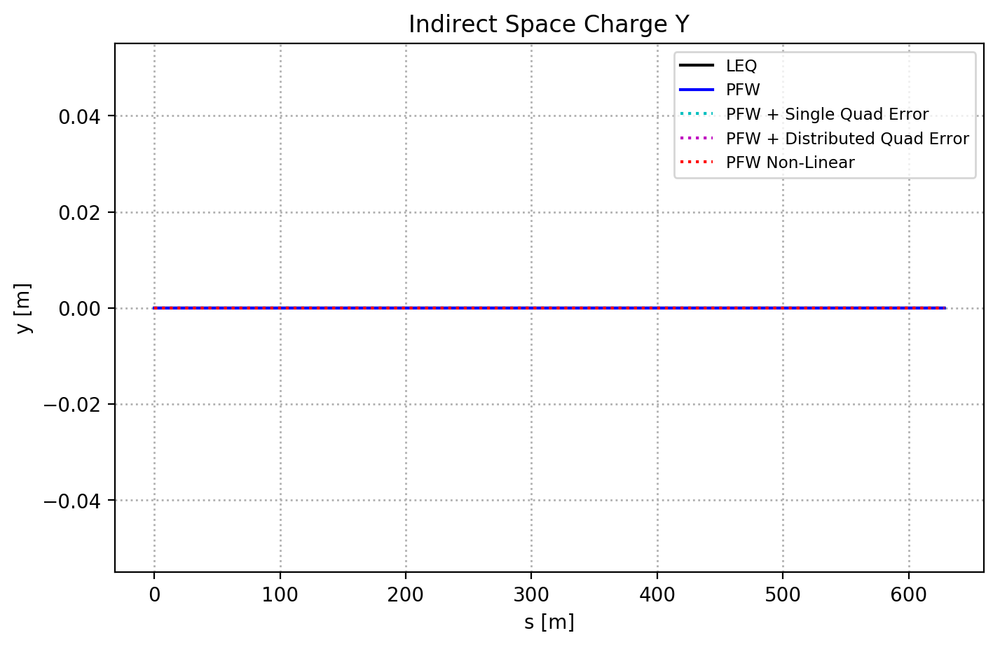

In [27]:
parameter = 'Y'

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel('y [m]');

ax1.plot(d_LEQ['S'], d_LEQ[parameter], label='LEQ', color='k');
ax1.plot(d_PFW['S'], d_PFW[parameter], label='PFW', color='b');
ax1.plot(d_PFW_Single['S'], d_PFW_Single[parameter], label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['S'], d_PFW_Distributed[parameter], label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['S'], d_PFW_nonlin[parameter], label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

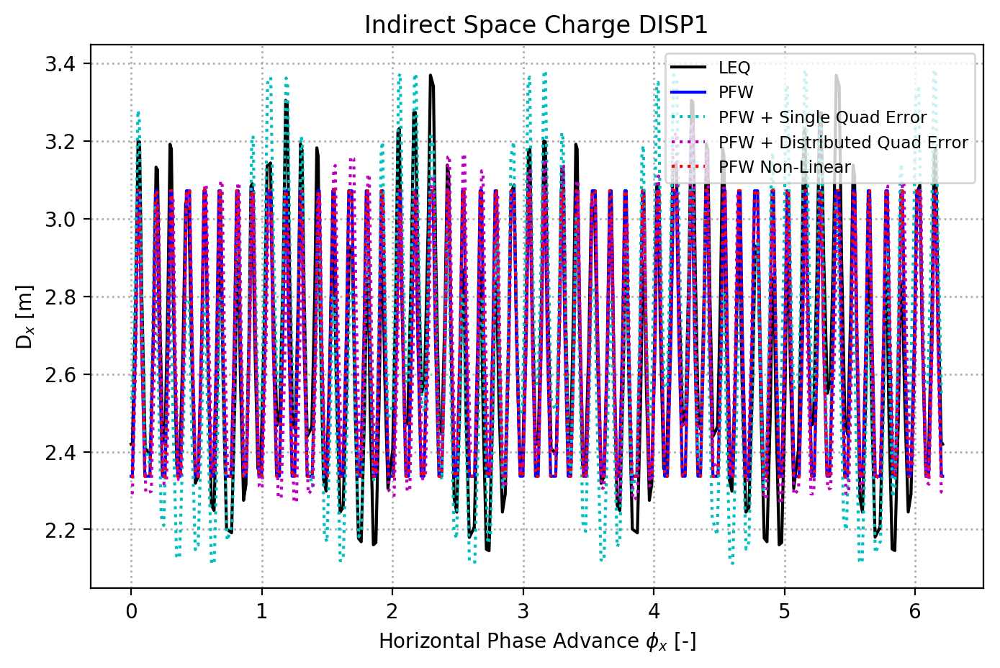

In [28]:
parameter = 'DISP1'
beta = 0.9158

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel(r'Horizontal Phase Advance $\phi_x$ [-]');
ax1.set_ylabel(r'D$_x$ [m]');

ax1.plot(d_LEQ['MU1'], np.array(d_LEQ[parameter])*beta, label='LEQ', color='k');
ax1.plot(d_PFW['MU1'], np.array(d_PFW[parameter])*beta, label='PFW', color='b');
ax1.plot(d_PFW_Single['MU1'], np.array(d_PFW_Single[parameter])*beta, label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['MU1'], np.array(d_PFW_Distributed[parameter])*beta, label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['MU1'], np.array(d_PFW_nonlin[parameter])*beta, label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '_2.png'
plt.savefig(savename, dpi = 200);

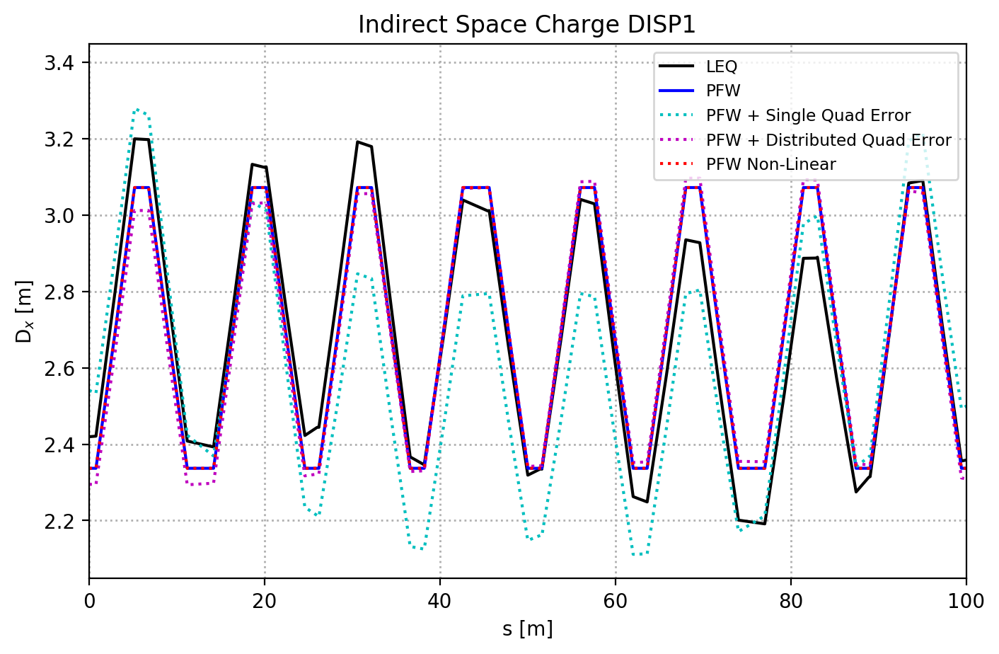

In [29]:
parameter = 'DISP1'
beta = 0.9158

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'D$_x$ [m]');

ax1.plot(d_LEQ['S'], np.array(d_LEQ[parameter])*beta, label='LEQ', color='k');
ax1.plot(d_PFW['S'], np.array(d_PFW[parameter])*beta, label='PFW', color='b');
ax1.plot(d_PFW_Single['S'], np.array(d_PFW_Single[parameter])*beta, label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['S'], np.array(d_PFW_Distributed[parameter])*beta, label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['S'], np.array(d_PFW_nonlin[parameter])*beta, label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
ax1.set_xlim(0,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '_zoom.png'
plt.savefig(savename, dpi = 200);

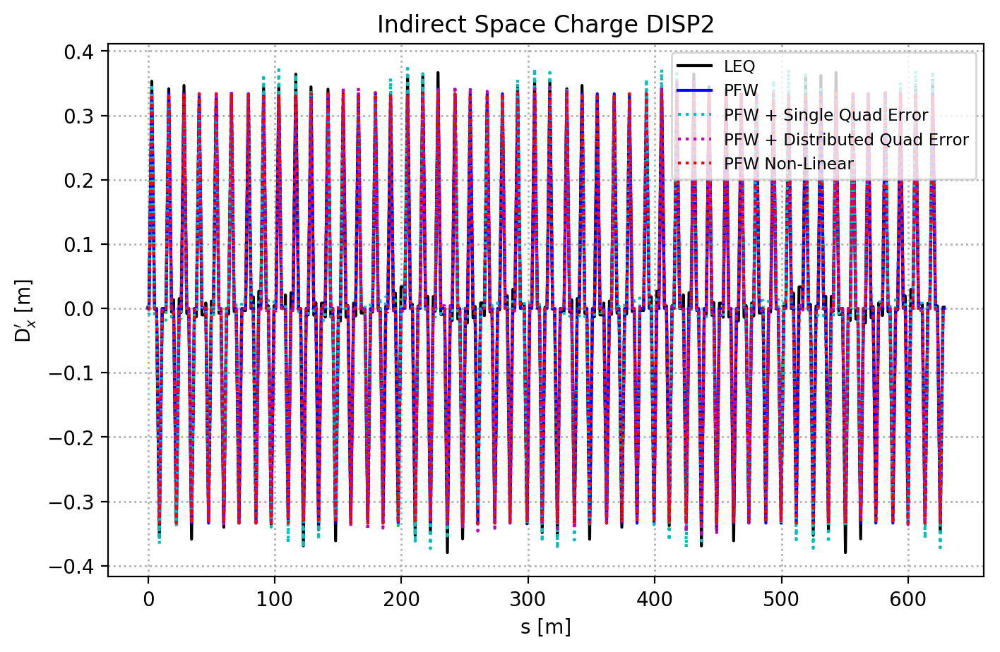

In [30]:
parameter = 'DISP2'
beta = 0.9158

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'D$_x^{\prime}$ [m]');

ax1.plot(d_LEQ['S'], np.array(d_LEQ[parameter])*beta, label='LEQ', color='k');
ax1.plot(d_PFW['S'], np.array(d_PFW[parameter])*beta, label='PFW', color='b');
ax1.plot(d_PFW_Single['S'], np.array(d_PFW_Single[parameter])*beta, label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['S'], np.array(d_PFW_Distributed[parameter])*beta, label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['S'], np.array(d_PFW_nonlin[parameter])*beta, label='PFW Non-Linear', color='r', ls=':');
       
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

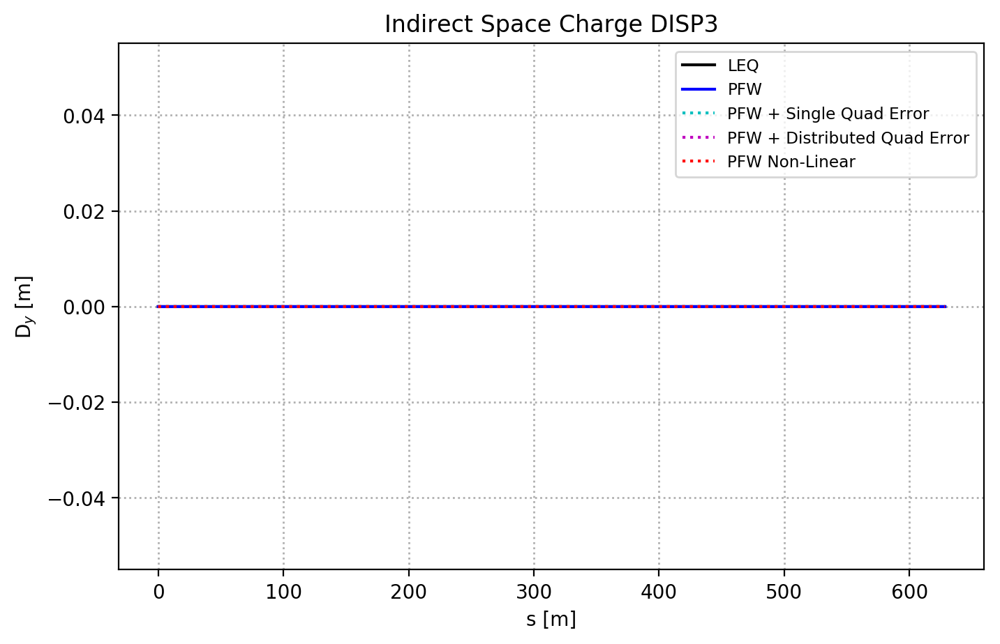

In [31]:
parameter = 'DISP3'
beta = 0.9158

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'D$_y$ [m]');

ax1.plot(d_LEQ['S'], np.array(d_LEQ[parameter])*beta, label='LEQ', color='k');
ax1.plot(d_PFW['S'], np.array(d_PFW[parameter])*beta, label='PFW', color='b');
ax1.plot(d_PFW_Single['S'], np.array(d_PFW_Single[parameter])*beta, label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['S'], np.array(d_PFW_Distributed[parameter])*beta, label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['S'], np.array(d_PFW_nonlin[parameter])*beta, label='PFW Non-Linear', color='r', ls=':');
     
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

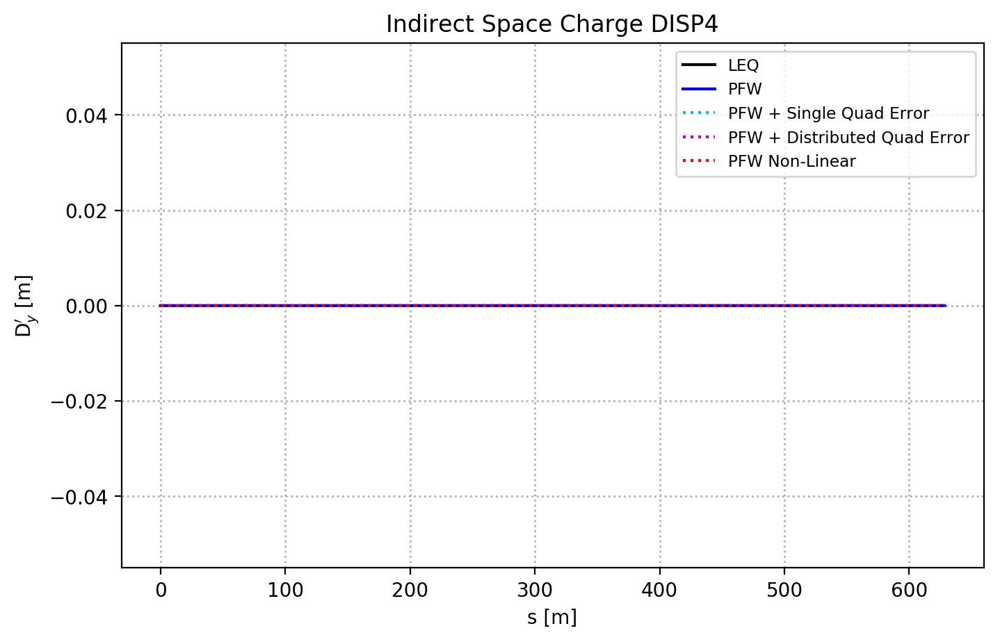

In [32]:
parameter = 'DISP4'
beta = 0.9158

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'D$_y^{\prime}$ [m]');

ax1.plot(d_LEQ['S'], np.array(d_LEQ[parameter])*beta, label='LEQ', color='k');
ax1.plot(d_PFW['S'], np.array(d_PFW[parameter])*beta, label='PFW', color='b');
ax1.plot(d_PFW_Single['S'], np.array(d_PFW_Single[parameter])*beta, label='PFW + Single Quad Error', color='c', ls=':');
ax1.plot(d_PFW_Distributed['S'], np.array(d_PFW_Distributed[parameter])*beta, label='PFW + Distributed Quad Error', color='m', ls=':');
ax1.plot(d_PFW_nonlin['S'], np.array(d_PFW_nonlin[parameter])*beta, label='PFW Non-Linear', color='r', ls=':');
       
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_' + parameter + '.png'
plt.savefig(savename, dpi = 200);

## Some important conclusions
- Using the LEQs (with respect to PFWs) generates optics perturbation due to the LEQs not being periodically positioned in the machine.
- Adding a single quadrupolar error in the PFW tune control lattice gives a similar magnitude of beta-beating.
- Adding a single quadrupolar error on the 20 QDNs in the PFW tune control lattice gives a similar magnitude of beta-beating.
- Including the non-linear fields (Sextupole and above) of the PFWs does not perturb the linear optics.

# Estimate bunch envelope size compared to average aperture

- $\epsilon_x$ = 1 mm mrad
- $\epsilon_y$ = 1 mm mrad

Using an elliptical aperture:
- full width = 0.73 m
- full height = 0.35 m

$$ \sigma_x = \sqrt{\beta_x \epsilon_x} $$

Use 3 $\sigma$ vs half-aperture

From simulations $\sigma_x \approx$ 3.55 mm, $\sigma_y \approx$ 3.32 mm at BWSV64 and our full bunch widths are ~6$\sigma$ in both planes. 

In [33]:
epsn_x = 1E-6
epsn_y = 1E-6

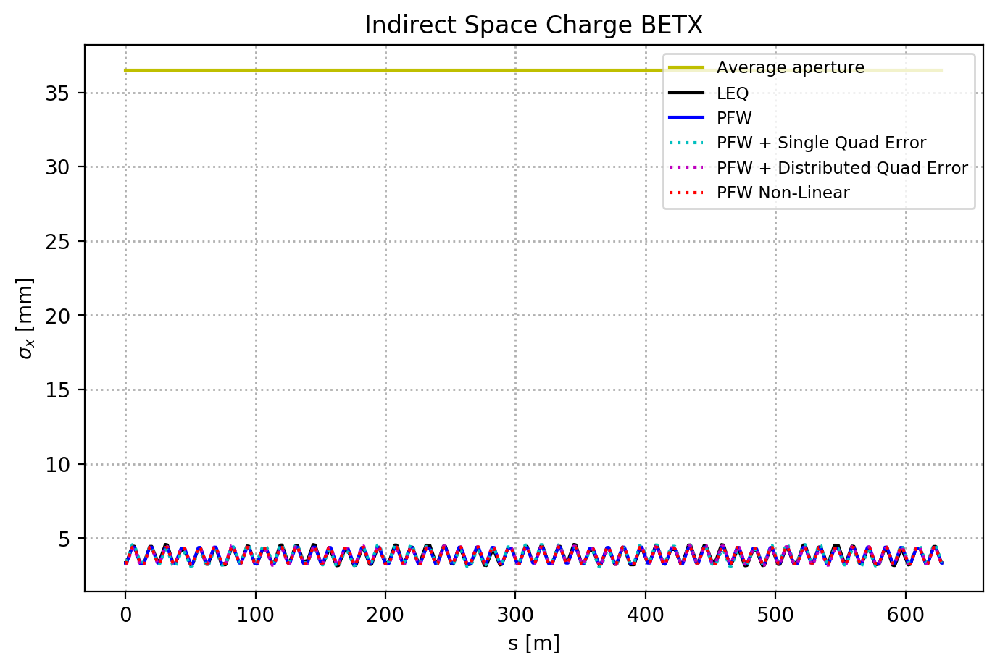

In [34]:
parameter = 'BETX'
parameter2 = 'DISP1'
multi = 1E3
dpp = 1E-3
beta  = 0.9158
gamma = 2.49038064
n_sigma = 1.0

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\sigma_x$ [mm]');

x = np.array([0.,628.])
y = np.array([73/2.,73/2.])
ax1.plot(x,y, color = 'y', label= 'Average aperture')

#x = np.array([0.,628.])
#y = np.array([3.5E-3,3.5E-3])
#ax1.plot(x,y, label= 'Simulated beam size')
fac1 = ((epsn_x/(beta*gamma)))

y1 = n_sigma*multi*np.sqrt( np.array(d_LEQ[parameter])*fac1 + ((np.array(d_LEQ[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_LEQ['S'], y1, label='LEQ', color='k');

y2 = n_sigma*multi*np.sqrt( np.array(d_PFW[parameter])*fac1 + ((np.array(d_PFW[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW['S'], y2, label='PFW', color='b');

y3 = n_sigma*multi*np.sqrt( np.array(d_PFW_Single[parameter])*fac1 + ((np.array(d_PFW_Single[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW_Single['S'], y3, label='PFW + Single Quad Error', color='c', ls=':');

y4 = n_sigma*multi*np.sqrt( np.array(d_PFW_Distributed[parameter])*fac1 + ((np.array(d_PFW_Distributed[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW_Distributed['S'], y4, label='PFW + Distributed Quad Error', color='m', ls=':');

y5 = n_sigma*multi*np.sqrt( np.array(d_PFW_nonlin[parameter])*fac1 + ((np.array(d_PFW_nonlin[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW_nonlin['S'], y5, label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_ylim(0,40)
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_x_beam_sigma_estimate.png'
plt.savefig(savename, dpi = 200);

In [35]:
sigma_leq = y1[0]
sigma_pfw = y2[0]
sigma_pfw_single = y3[0]
sigma_pfw_dist = y4[0]
sigma_pfw_nonlin = y5[0]
print '1 sigma values: '
print round_sig(sigma_leq), 'mm'
print round_sig(sigma_pfw), 'mm'
print round_sig(sigma_pfw_single), 'mm'
print round_sig(sigma_pfw_dist), 'mm'
print round_sig(sigma_pfw_nonlin), 'mm'

1 sigma values: 
3.35 mm
3.32 mm
3.45 mm
3.27 mm
3.32 mm


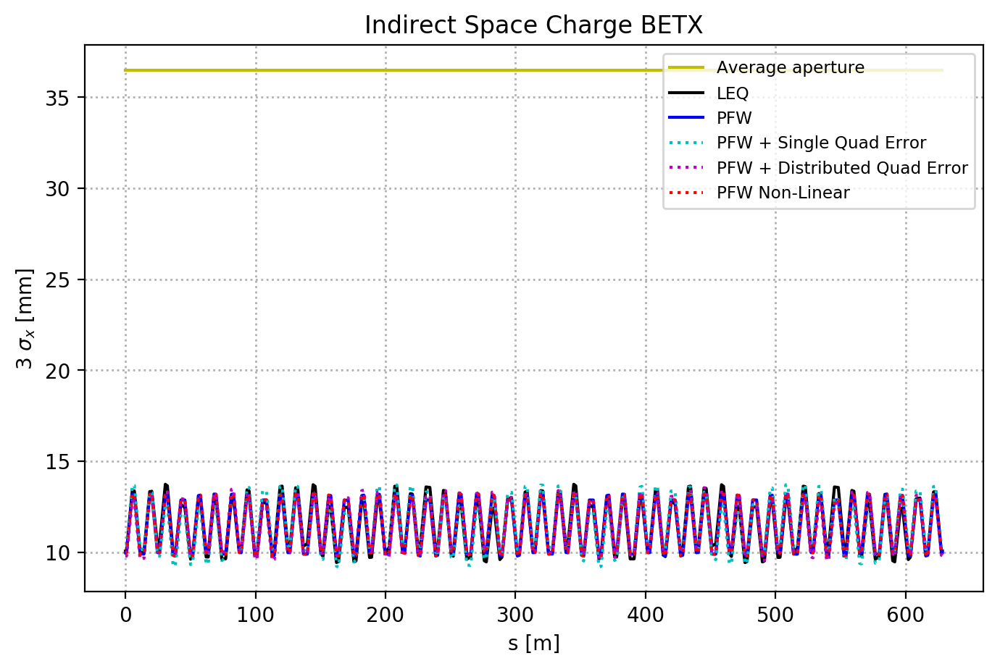

In [36]:
parameter = 'BETX'
parameter2 = 'DISP1'
multi = 1E3
dpp = 1E-3
beta  = 0.9158
gamma = 2.49038064
n_sigma = 3.0

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'3 $\sigma_x$ [mm]');

x = np.array([0.,628.])
y = np.array([73/2.,73/2.])
ax1.plot(x,y, color = 'y', label= 'Average aperture')

#x = np.array([0.,628.])
#y = np.array([3.5E-3,3.5E-3])
#ax1.plot(x,y, label= 'Simulated beam size')
fac1 = ((epsn_x/(beta*gamma)))

y1 = n_sigma*multi*np.sqrt( np.array(d_LEQ[parameter])*fac1 + ((np.array(d_LEQ[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_LEQ['S'], y1, label='LEQ', color='k');

y2 = n_sigma*multi*np.sqrt( np.array(d_PFW[parameter])*fac1 + ((np.array(d_PFW[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW['S'], y2, label='PFW', color='b');

y3 = n_sigma*multi*np.sqrt( np.array(d_PFW_Single[parameter])*fac1 + ((np.array(d_PFW_Single[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW_Single['S'], y3, label='PFW + Single Quad Error', color='c', ls=':');

y4 = n_sigma*multi*np.sqrt( np.array(d_PFW_Distributed[parameter])*fac1 + ((np.array(d_PFW_Distributed[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW_Distributed['S'], y4, label='PFW + Distributed Quad Error', color='m', ls=':');

y4 = n_sigma*multi*np.sqrt( np.array(d_PFW_nonlin[parameter])*fac1 + ((np.array(d_PFW_nonlin[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW_nonlin['S'], y4, label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_ylim(0,40)
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_x_beam_size_estimate.png'
plt.savefig(savename, dpi = 200);

- Currently we use 128 bins to cover ~ 30 mm beam-width
- To extend the same grid granularity over the boundary we have a factor ~ 36.5/15=2.43 
- Final bin size = 128 * 2.43 = 311


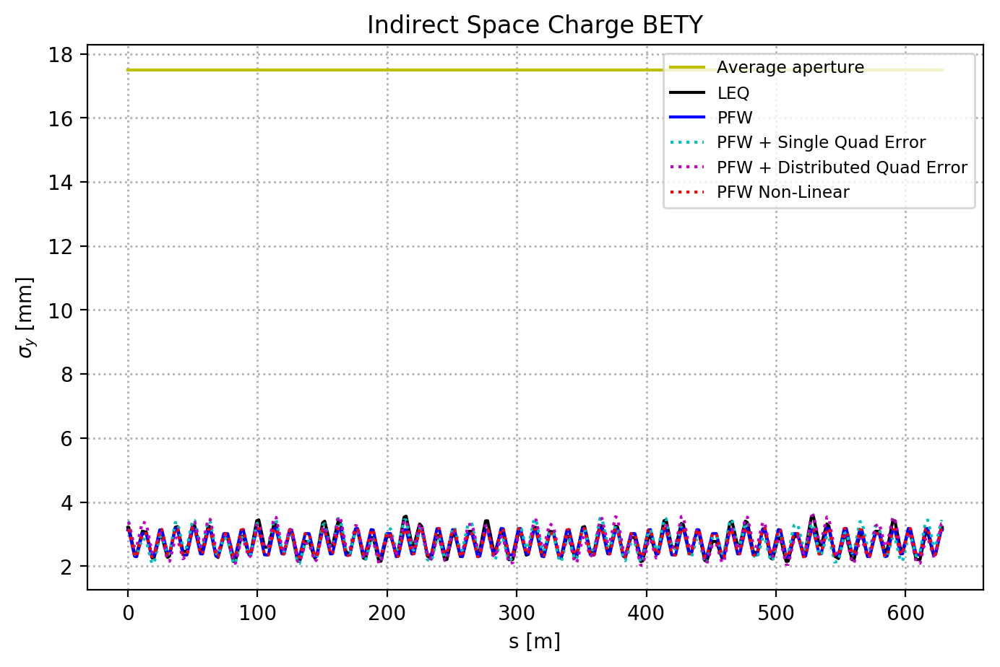

In [37]:
parameter = 'BETY'
parameter2 = 'DISP3'
multi = 1E3
dpp = 1E-3
beta  = 0.9158
gamma = 2.49038064
n_sigma = 1.0

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'$\sigma_y$ [mm]');

x = np.array([0.,628.])
y = np.array([35/2.,35/2.])
ax1.plot(x,y, color = 'y', label= 'Average aperture')

#x = np.array([0.,628.])
#y = np.array([3.5E-3,3.5E-3])
#ax1.plot(x,y, label= 'Simulated beam size')
fac1 = ((epsn_x/(beta*gamma)))

y1 = n_sigma*multi*np.sqrt( np.array(d_LEQ[parameter])*fac1 + ((np.array(d_LEQ[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_LEQ['S'], y1, label='LEQ', color='k');

y2 = n_sigma*multi*np.sqrt( np.array(d_PFW[parameter])*fac1 + ((np.array(d_PFW[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW['S'], y2, label='PFW', color='b');

y3 = n_sigma*multi*np.sqrt( np.array(d_PFW_Single[parameter])*fac1 + ((np.array(d_PFW_Single[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW_Single['S'], y3, label='PFW + Single Quad Error', color='c', ls=':');

y4 = n_sigma*multi*np.sqrt( np.array(d_PFW_Distributed[parameter])*fac1 + ((np.array(d_PFW_Distributed[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW_Distributed['S'], y4, label='PFW + Distributed Quad Error', color='m', ls=':');

y5 = n_sigma*multi*np.sqrt( np.array(d_PFW_nonlin[parameter])*fac1 + ((np.array(d_PFW_nonlin[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW_nonlin['S'], y5, label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_ylim(0,40)
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_y_beam_sigma_estimate.png'
plt.savefig(savename, dpi = 200);

In [38]:
sigma_leq = y1[0]
sigma_pfw = y2[0]
sigma_pfw_single = y3[0]
sigma_pfw_dist = y4[0]
sigma_pfw_nonlin = y5[0]
print '1 sigma values: '
print round_sig(sigma_leq), 'mm'
print round_sig(sigma_pfw), 'mm'
print round_sig(sigma_pfw_single), 'mm'
print round_sig(sigma_pfw_dist), 'mm'
print round_sig(sigma_pfw_nonlin), 'mm'

1 sigma values: 
3.21 mm
3.14 mm
3.39 mm
3.33 mm
3.14 mm


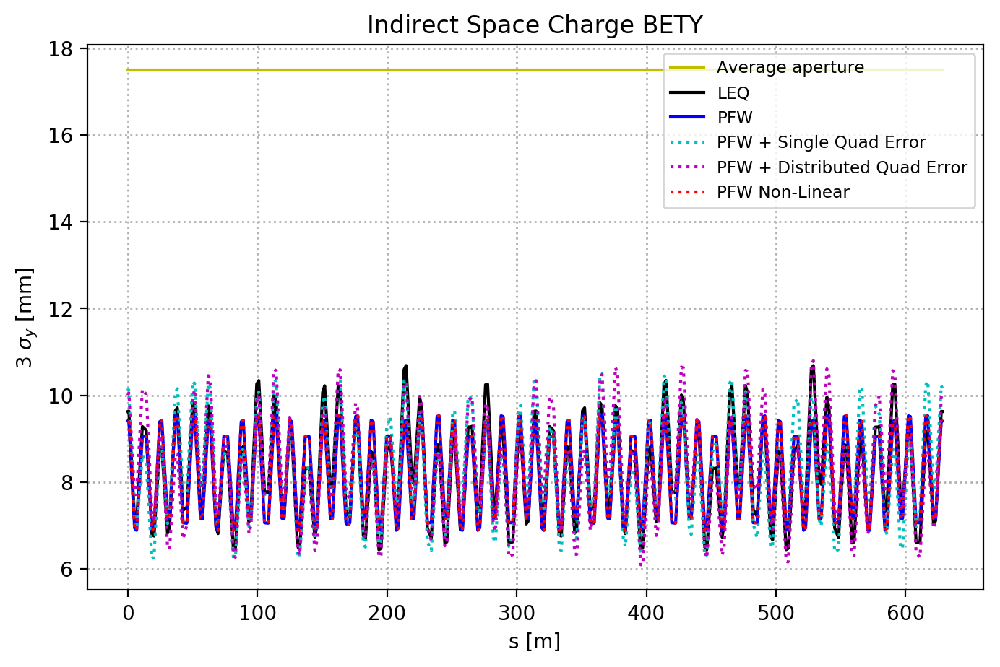

In [39]:
parameter = 'BETY'
parameter2 = 'DISP3'
multi = 1E3
dpp = 1E-3
beta  = 0.9158
gamma = 2.49038064
n_sigma = 3.0

fig1 = plt.figure(facecolor='w', edgecolor='k')
ax1 = fig1.add_subplot(111)

tit = main_label + ' ' + parameter
ax1.set_title(tit);

ax1.set_xlabel('s [m]');
ax1.set_ylabel(r'3 $\sigma_y$ [mm]');

x = np.array([0.,628.])
y = np.array([35/2.,35/2.])
ax1.plot(x,y, color = 'y', label= 'Average aperture')

#x = np.array([0.,628.])
#y = np.array([3.5E-3,3.5E-3])
#ax1.plot(x,y, label= 'Simulated beam size')
fac1 = ((epsn_x/(beta*gamma)))

y1 = n_sigma*multi*np.sqrt( np.array(d_LEQ[parameter])*fac1 + ((np.array(d_LEQ[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_LEQ['S'], y1, label='LEQ', color='k');

y2 = n_sigma*multi*np.sqrt( np.array(d_PFW[parameter])*fac1 + ((np.array(d_PFW[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW['S'], y2, label='PFW', color='b');

y3 = n_sigma*multi*np.sqrt( np.array(d_PFW_Single[parameter])*fac1 + ((np.array(d_PFW_Single[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW_Single['S'], y3, label='PFW + Single Quad Error', color='c', ls=':');

y4 = n_sigma*multi*np.sqrt( np.array(d_PFW_Distributed[parameter])*fac1 + ((np.array(d_PFW_Distributed[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW_Distributed['S'], y4, label='PFW + Distributed Quad Error', color='m', ls=':');

y5 = n_sigma*multi*np.sqrt( np.array(d_PFW_nonlin[parameter])*fac1 + ((np.array(d_PFW_nonlin[parameter2])*beta)**2 * dpp**2) )
ax1.plot(d_PFW_nonlin['S'], y5, label='PFW Non-Linear', color='r', ls=':');
        
ax1.legend(loc=1)
ax1.grid(lw=1, ls=':');
#ax1.set_ylim(0,40)
#ax1.set_xlim(-10,100)

savename = save_folder + '/'+ main_label + '_y_beam_size_estimate.png'
plt.savefig(savename, dpi = 200);

- Currently we use 128 bins to cover ~ 22mm beam-height
- To extend the same grid granularity over the boundary we have a factor ~ 17.5/11 = 1.6
- Final bin size = 128 * 1.6 = 205

# Estimated space chrage grid size to cover boundary and maintain granularity
- x = 311 (factor 2.43 increase)
- y = 205 (factor 1.6 increase)
- z = 64 (unchanged)

# If we take the minimum beam size values:
- x = 468 (factor 3.65 increase)
- y = 372 (factor 2.9 increase)
- z = 64 (unchanged)